<a href="https://colab.research.google.com/github/Baris77a/github_actions/blob/main/U-NET-SEGMENTATION_WITH_METRICS_AND_DATA_AUGMENTATION_BARIS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
#The patchify package is used for breaking down large arrays or images into smaller patches and then reconstructing them.
#This is particularly useful in image processing and Deep Learning tasks, where processing smaller patches can be more efficient and effective than working with large images.
!pip install patchify

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


import cv2
import os
import geopandas as gpd

from patchify import patchify
from PIL import Image #The Python Imaging Library (PIL) is a powerful library for opening, manipulating, and saving many different image file formats.
from sklearn.preprocessing import MinMaxScaler, StandardScaler

import random

In [4]:
#Get the images needed
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [5]:
#Get an overview of all the images in Setofimages and Paris
!ls -lah '/content/drive/MyDrive/Colab_Notebooks/Setofimages'
!ls -lah '/content/drive/MyDrive/Colab_Notebooks/Paris'

total 16K
drwx------ 2 root root 4.0K Apr 30 08:18 metrics_image_test
drwx------ 2 root root 4.0K Apr  2 15:58 resized
drwx------ 2 root root 4.0K Apr  2 15:58 train
drwx------ 2 root root 4.0K Apr  2 15:58 train_labels
total 30M
drwx------ 2 root root 4.0K Apr  9 11:29 AOI_3_Paris_Test_public
-rw------- 1 root root 6.8M Mar  4  2017 AOI_3_Paris_Train_Building_Solutions.csv
drwx------ 2 root root 4.0K May  7 19:54 imagesParis
drwx------ 2 root root 4.0K Jun 23 15:37 imagesParis3Band
drwx------ 2 root root 4.0K Jun 23 15:35 imagesParis3Band_tif
drwx------ 2 root root 4.0K Jun 18 20:27 imagesParis8Band
drwx------ 2 root root 4.0K May  7 19:54 masksParis
drwx------ 2 root root 4.0K Jun  6 22:21 masksParis3Band
drwx------ 2 root root 4.0K Jun 18 20:27 masksParis8Band
-rw------- 1 root root  23M May 17 16:58 model_paris.keras
drwx------ 2 root root 4.0K Apr  9 11:29 SN2_buildings_train_AOI_3_Paris


In [6]:
# Prepare a Trainingset
Img_PATH = '/content/drive/MyDrive/Colab_Notebooks/Setofimages/train'
Mask_PATH = '/content/drive/MyDrive/Colab_Notebooks/Setofimages/train_labels'

#Img_PATH = '/content/drive/MyDrive/Colab_Notebooks/Paris/imagesParis3Band'
#Mask_PATH = '/content/drive/MyDrive/Colab_Notebooks/Paris/masksParis3Band'

input_img_paths = sorted(
    [
        os.path.join(Img_PATH, fname)
        for fname in os.listdir(Img_PATH)
        if fname.endswith(".tiff")
    ]
)
annotation_img_paths = sorted(
    [
        os.path.join(Mask_PATH, fname)
        for fname in os.listdir(Mask_PATH)
        if fname.endswith(".tif") #and not fname.startswith(".")
    ]
)

df_path = pd.DataFrame(zip(input_img_paths, annotation_img_paths), columns=['image', 'mask'])
df_path

,image,mask
0,/content/drive/MyDrive/Colab_Notebooks/Setofim...,/content/drive/MyDrive/Colab_Notebooks/Setofim...
1,/content/drive/MyDrive/Colab_Notebooks/Setofim...,/content/drive/MyDrive/Colab_Notebooks/Setofim...
2,/content/drive/MyDrive/Colab_Notebooks/Setofim...,/content/drive/MyDrive/Colab_Notebooks/Setofim...
3,/content/drive/MyDrive/Colab_Notebooks/Setofim...,/content/drive/MyDrive/Colab_Notebooks/Setofim...
4,/content/drive/MyDrive/Colab_Notebooks/Setofim...,/content/drive/MyDrive/Colab_Notebooks/Setofim...
5,/content/drive/MyDrive/Colab_Notebooks/Setofim...,/content/drive/MyDrive/Colab_Notebooks/Setofim...
6,/content/drive/MyDrive/Colab_Notebooks/Setofim...,/content/drive/MyDrive/Colab_Notebooks/Setofim...
7,/content/drive/MyDrive/Colab_Notebooks/Setofim...,/content/drive/MyDrive/Colab_Notebooks/Setofim...
8,/content/drive/MyDrive/Colab_Notebooks/Setofim...,/content/drive/MyDrive/Colab_Notebooks/Setofim...
9,/content/drive/MyDrive/Colab_Notebooks/Setofim...,/content/drive/MyDrive/Colab_Notebooks/Setofim...


In [7]:
image_patch_size = 256 #256 is an assumption

In [8]:
minmaxscaler = MinMaxScaler()

In [9]:
# preprocessing the images

image_dataset = []
#For Performance Reason 0 - 21
for image_id in range(0,21):

  path = df_path['image'].iloc[image_id]
  image = cv2.imread(path)

  # patching and croping the image
  # Determine the dimensions to which the image should be cropped to ensure that the dimensions
  # are multiples of the image_patch_size.
  size_x = (image.shape[1]//image_patch_size)*image_patch_size
  size_y = (image.shape[0]//image_patch_size)*image_patch_size

  # Convert the NumPy array (image) to a PIL image.
  image = Image.fromarray(image)

  # Crop the PIL image to the calculated size.
  image = image.crop((0,0, size_x, size_y))

  # Convert the PIL image back to a NumPy array.
  image = np.array(image)

  # Patchify the image: split it into smaller patches of size (image_patch_size, image_patch_size, 3).
  patched_images = patchify(image, (image_patch_size, image_patch_size, 3), step=image_patch_size)

  for i in range(patched_images.shape[0]):
    for j in range(patched_images.shape[1]):
      individual_patched_image = patched_images[i,j,:,:]
      #Standarize images
      #First reshape: reshapes the patch into a 2D array where each row is a pixel and each column is a color channel.
      #This is necessary because MinMaxScaler works on 2D arrays where each row is a sample and each column is a feature.
      #Second reshape:  reshapes the standardized data back to its original 3D shape
      individual_patched_image = minmaxscaler.fit_transform(individual_patched_image.reshape(-1, individual_patched_image.shape[-1])).reshape(individual_patched_image.shape)
      individual_patched_image = individual_patched_image[0]
      #print(individual_patched_image.shape)
      image_dataset.append(individual_patched_image)

In [10]:
# masks in 2D
# preprocessing the masks
# patching and cropping like the images
#This is just an example. For the project we will creat our own mask.
mask_dataset = []

for mask_id in range(0,21):

  path = df_path['mask'].iloc[mask_id]
  image = cv2.imread(path)

  # Convert the image to grayscale using cv2.cvtColor()
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  #patching and croping the image
  # Determine the dimensions to which the image should be cropped to ensure that the dimensions
  # are multiples of the image_patch_size.
  size_x = (image.shape[1]//image_patch_size)*image_patch_size
  size_y = (image.shape[0]//image_patch_size)*image_patch_size

  # Convert the NumPy array (image) to a PIL image.
  image = Image.fromarray(image)

  # Crop the PIL image to the calculated size.
  image = image.crop((0,0, size_x, size_y))

  # Convert the PIL image back to a NumPy array.
  image = np.array(image)
  patched_images = patchify(image, (image_patch_size, image_patch_size), step=image_patch_size)

  for i in range(patched_images.shape[0]):
    for j in range(patched_images.shape[1]):
      individual_patched_mask = patched_images[i,j]
      mask_dataset.append(individual_patched_mask)

In [11]:
# This line from https://github.com/bnsreenu/python_for_microscopists/blob/master/204_train_simple_unet_for_mitochondria.py
# Adding one dimension for the label on the 2D mask dataset
# The purpose of adding this dimension is to prepare the mask dataset
# for compatibility with models that expect a channel dimension (even if it's just one channel).
#If mask_dataset is a 3D array with shape (num_masks, height, width),
#this will transform it to a 4D array with shape (num_masks, height, width, 1).
mask_dataset = np.expand_dims((np.array(mask_dataset)),3)/255.# for normalization 0 or 1

In [12]:
print(mask_dataset.shape)

(525, 256, 256, 1)


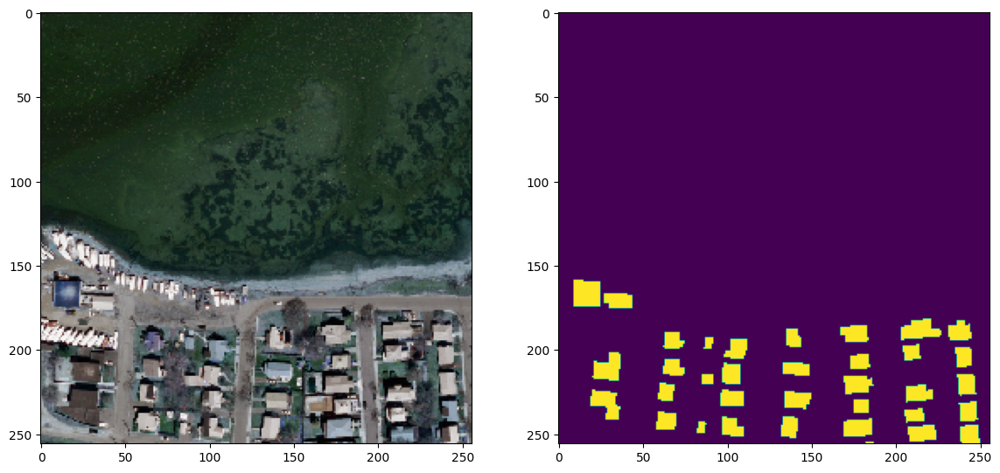

In [13]:
# showing random images with the corresponding mask
random_image_id = random.randint(0, len(image_dataset))

plt.figure(figsize=(14,8))
plt.subplot(121)
plt.imshow(image_dataset[random_image_id])
plt.subplot(122)
plt.imshow(mask_dataset[random_image_id]);

In [14]:

image_dataset = np.array(image_dataset)
mask_dataset = np.array(mask_dataset)

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(image_dataset, mask_dataset, test_size=0.15)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(446, 256, 256, 3)
(79, 256, 256, 3)
(446, 256, 256, 1)
(79, 256, 256, 1)


In [15]:
# Data Augmentation
# Data Augmentation is applied during the preprocessing, before the model training
# Those are the packages we are going to neeed for the data augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from scipy.ndimage import rotate, gaussian_filter, map_coordinates

In [16]:
# Define data augmentation parameters
elastic_deformation_sigma = 50  #
alpha = 80  #
rotation_range = 90  #
horizontal_flip = True  #
vertical_flip = True  #
batch_size = len(X_train)  #

In [17]:
# Define custom data augmentation function for elastic deformation
def elastic_deformation(image, sigma=6, alpha=40, rotation_range = 90):
    """
    Apply elastic deformation to a 2D image with multiple channels.

    Parameters:
    image (numpy array): Input image with shape (height, width, channels)
    sigma (float): Standard deviation for the Gaussian filter
    alpha (float): Scaling factor for the deformation
    rotation_range (float): Rotation angle in degrees

    Returns:
    numpy array: Deformed image with the same shape as input
    """

    shape = image.shape
    random_state = np.random.RandomState(None)

    # random_state.rand(*shape[:2]) generates a random displacement field of the same height and width as the input image.
    # Values are between 0 and 1.
    # (random_state.rand(*shape[:2]) * 2 - 1) shifts the values to be between -1 and 1.
    # gaussian_filter(..., sigma, mode="constant", cval=0) smooths the displacement field using a Gaussian filter.
    # Multiplying by alpha scales the displacement.
    dx = gaussian_filter((random_state.rand(*shape[:2]) * 2 - 1), sigma, mode="constant", cval=0) * alpha
    dy = gaussian_filter((random_state.rand(*shape[:2]) * 2 - 1), sigma, mode="constant", cval=0) * alpha

    #np.meshgrid creates a coordinate grid of the same size as the input image. x and y represent the coordinates of the pixels.
    x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))

    #The displacement fields dy and dx are added to the y and x coordinates, respectively.
    indices = np.reshape(y + dy, (-1, 1)), np.reshape(x + dx, (-1, 1))

    #An empty array deformed_image is created to store the deformed image.
    deformed_image = np.zeros_like(image)
    for i in range(shape[2]):  # Apply the deformation to each channel
        deformed_image[:, :, i] = map_coordinates(image[:, :, i], indices, order=1, mode='reflect').reshape(shape[:2])
    # Apply rotation
    #angle = np.random.uniform(-rotation_range, rotation_range)
    #rotated_image = rotate(deformed_image, angle, reshape=False)
    rotated_image = rotate(deformed_image, rotation_range, reshape=False)

    return rotated_image

In [18]:
def custom_data_generator(images, masks, batch_size, elastic_deformation_sigma, alpha, rotation_range, horizontal_flip=True, vertical_flip=True):
    """
    Generate batches of images and masks with optional elastic deformation, rotations, and flips for data augmentation.

    Parameters:
    images (numpy array): Array of images with shape (num_images, height, width, channels).
    masks (numpy array): Array of masks with shape (num_images, height, width, channels).
    batch_size (int): Number of images and masks per batch.
    elastic_deformation_sigma (float): Standard deviation for the Gaussian filter in elastic deformation.
    alpha (float): Scaling factor for elastic deformation.
    rotation_range (float): Range of random rotations in degrees.
    horizontal_flip (bool): Whether to randomly flip images and masks horizontally. Default is True.
    vertical_flip (bool): Whether to randomly flip images and masks vertically. Default is True.

    Returns:
    generator: A generator that yields tuples of (image_batch, mask_batch, image_batch_deformed, mask_batch_deformed).
    """
    data_gen = ImageDataGenerator(
        rotation_range=rotation_range,
        horizontal_flip=horizontal_flip,
        vertical_flip=vertical_flip
    )

    # Create generators for images and masks with the same augmentation parameters
    image_gen = data_gen.flow(images, batch_size=batch_size, seed=42)
    mask_gen = data_gen.flow(masks, batch_size=batch_size, seed=42)

    while True:
        # Generate the next batch of images and masks
        image_batch = next(image_gen)
        mask_batch = next(mask_gen)

        #
        #image_batch_deformed = np.array([elastic_deformation(img, sigma=elastic_deformation_sigma, alpha=alpha) for img in image_batch])
        #mask_batch_deformed = np.array([elastic_deformation(mask, sigma=elastic_deformation_sigma, alpha=alpha) for mask in mask_batch])

         # Apply elastic deformation to each image and mask in the batch
        image_batch_deformed = np.array([elastic_deformation(img, sigma=elastic_deformation_sigma, alpha=alpha, rotation_range=rotation_range) for img in image_batch])
        mask_batch_deformed = np.array([elastic_deformation(mask, sigma=elastic_deformation_sigma, alpha=alpha, rotation_range=rotation_range) for mask in mask_batch])

        yield image_batch, mask_batch, image_batch_deformed, mask_batch_deformed

(446, 256, 256, 3)
(446, 256, 256, 1)
(446, 256, 256, 3)
(446, 256, 256, 1)


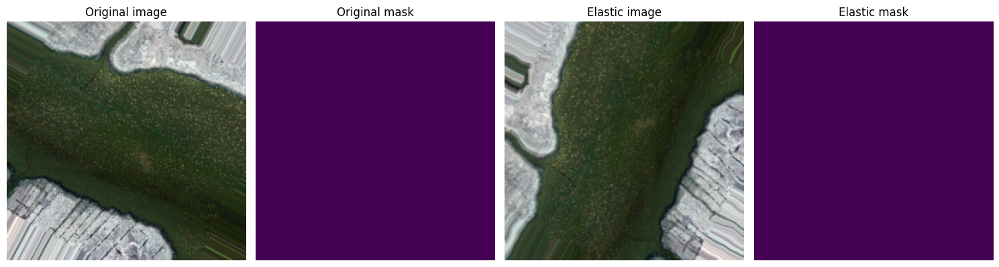

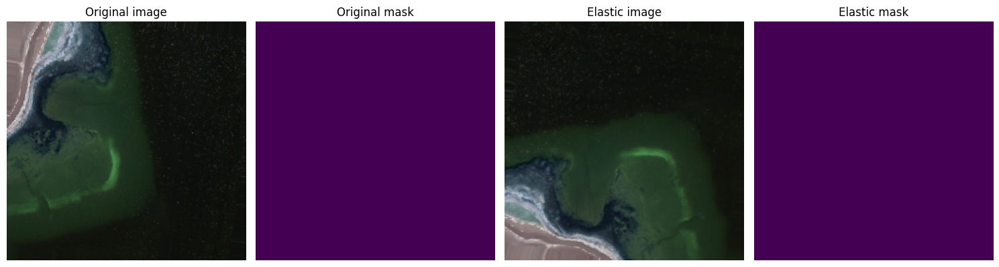

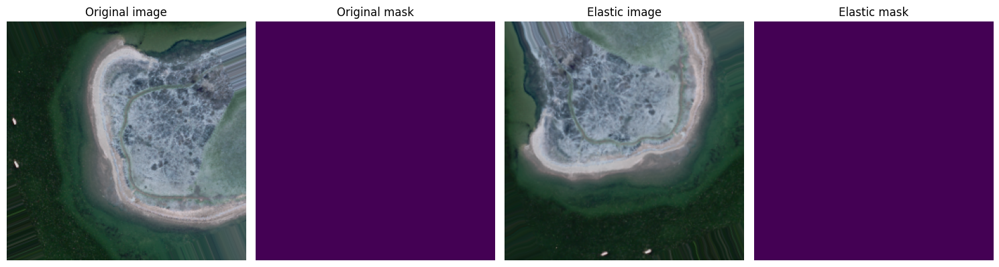

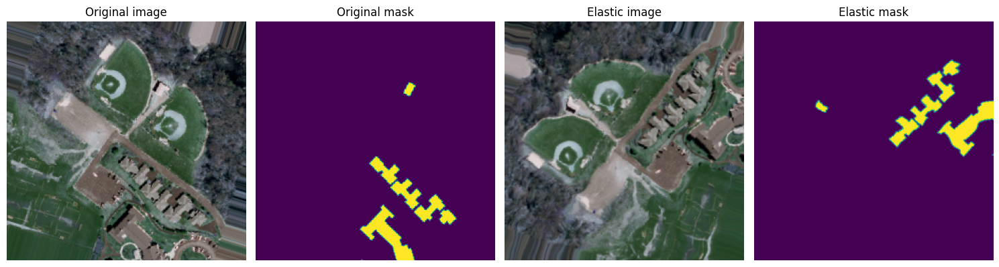

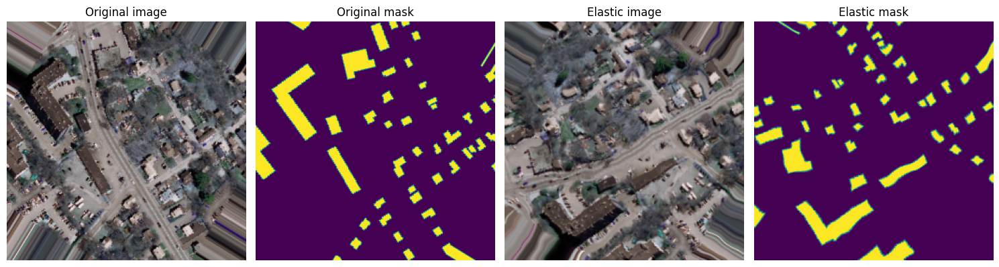

In [105]:
# Define data augmentation parameters
#For satellite pictures with the goal of object-detection, it is recommended the following input parameters
# 5 o 7 for Sigma:
#These values produce smooth deformations that mimic natural variations in satellite images, such as atmospheric effects or slight geometric distortions from cameras.
#30 to 50 for alpha:
#These values provide moderate distortions that are strong enough to train the model to be robust against such variations but not so strong that they appear unnatural.

# Parameter ranges for satellite images
elastic_deformation_sigma_range = [5, 6, 7]
alpha_range = [30, 40, 50]

# Randomly select sigma and alpha within the provided ranges
sigma_random = random.choice(elastic_deformation_sigma_range)
alpha_random = random.choice(alpha_range)

rotation_range = 90
#horizontal_flip = True
#vertical_flip = True
batch_size = len(X_train)

gen = custom_data_generator(X_train, y_train, batch_size, sigma_random, alpha_random, rotation_range, horizontal_flip=True, vertical_flip=True)

#
X_train_original = []
y_train_original = []
X_train_augmented = []
y_train_augmented = []

#
for X_batch, y_batch, X_batch_deformed, y_batch_deformed in gen:
    X_train_original.append(X_batch)
    y_train_original.append(y_batch)
    X_train_augmented.append(X_batch_deformed)
    y_train_augmented.append(y_batch_deformed)
    break

#
X_train_original = np.concatenate(X_train_original, axis=0)
y_train_original = np.concatenate(y_train_original, axis=0)
X_train_augmented = np.concatenate(X_train_augmented, axis=0)
y_train_augmented = np.concatenate(y_train_augmented, axis=0)

#
print(X_train_original.shape)
print(y_train_original.shape)
print(X_train_augmented.shape)
print(y_train_augmented.shape)

#
num_images_to_display = 5

#
for i in range(num_images_to_display):
    #
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 4, 1)
    plt.imshow(X_train_original[i])
    plt.title('Original image')
    plt.axis('off')

    plt.subplot(2, 4, 2)
    plt.imshow(y_train_original[i])
    plt.title('Original mask')
    plt.axis('off')

    #
    plt.subplot(2, 4, 3)
    plt.imshow(X_train_augmented[i])
    plt.title('Elastic image')
    plt.axis('off')

    plt.subplot(2, 4, 4)
    plt.imshow(y_train_augmented[i])
    plt.title('Elastic mask')
    plt.axis('off')

    #
    plt.tight_layout()
    plt.show()

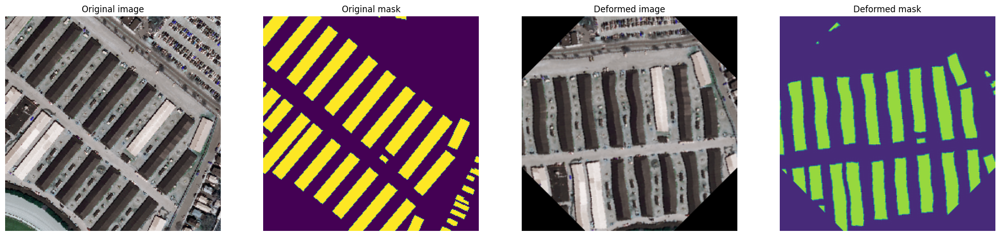

In [ ]:
#This Cell is just for debugging the elastic_deformation
example_image = X_train[10]  # Annahme: das erste Bild in X_train
example_mask = y_train[10]  # Annahme: das erste Bild in X_train
deformed_example_image = elastic_deformation(example_image, sigma=8, alpha=40, rotation_range = 45)
deformed_example_mask = elastic_deformation(example_mask, sigma=8, alpha=40, rotation_range = 45)
#def elastic_deformation(image, sigma=6, alpha=40, rotation_range = 90):

#
plt.figure(figsize=(25, 20))
plt.subplot(1, 4, 1)
plt.imshow(example_image)
plt.title('Original image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(example_mask)
plt.title('Original mask')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(deformed_example_image)
plt.title('Deformed image')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(deformed_example_mask)
plt.title('Deformed mask')
plt.axis('off')
plt.show();

In [106]:
image_height = X_train.shape[1]
image_width = X_train.shape[2]
image_channels = X_train.shape[3]
print(image_height)
print(image_width)
print(image_channels)

256
256
3


In [19]:
!ls -lah '/content/drive/MyDrive/Colab_Notebooks/Paris'

total 30M
drwx------ 2 root root 4.0K Apr  9 11:29 AOI_3_Paris_Test_public
-rw------- 1 root root 6.8M Mar  4  2017 AOI_3_Paris_Train_Building_Solutions.csv
drwx------ 2 root root 4.0K May  7 19:54 imagesParis
drwx------ 2 root root 4.0K Jun 23 15:37 imagesParis3Band
drwx------ 2 root root 4.0K Jun 23 15:35 imagesParis3Band_tif
drwx------ 2 root root 4.0K Jun 18 20:27 imagesParis8Band
drwx------ 2 root root 4.0K May  7 19:54 masksParis
drwx------ 2 root root 4.0K Jun  6 22:21 masksParis3Band
drwx------ 2 root root 4.0K Jun 18 20:27 masksParis8Band
-rw------- 1 root root  23M May 17 16:58 model_paris.keras
drwx------ 2 root root 4.0K Apr  9 11:29 SN2_buildings_train_AOI_3_Paris


In [20]:
#Testing now with 3 Channels pictures from Paris
# Prepare a Trainingset
Img_PATH_Paris = '/content/drive/MyDrive/Colab_Notebooks/Paris/imagesParis3Band'
Mask_PATH_Paris = '/content/drive/MyDrive/Colab_Notebooks/Paris/masksParis3Band'


input_img_paths_Paris = sorted(
    [
        os.path.join(Img_PATH_Paris, fname)
        for fname in os.listdir(Img_PATH_Paris)
        if fname.endswith(".jpg")
    ]
)
annotation_img_paths_Paris = sorted(
    [
        os.path.join(Mask_PATH_Paris, fname)
        for fname in os.listdir(Mask_PATH_Paris)
        if fname.endswith(".png") #and not fname.startswith(".")
    ]
)

df_path_Paris = pd.DataFrame(zip(input_img_paths_Paris, annotation_img_paths_Paris), columns=['image', 'mask'])
df_path_Paris


,image,mask
0,/content/drive/MyDrive/Colab_Notebooks/Paris/i...,/content/drive/MyDrive/Colab_Notebooks/Paris/m...
1,/content/drive/MyDrive/Colab_Notebooks/Paris/i...,/content/drive/MyDrive/Colab_Notebooks/Paris/m...
2,/content/drive/MyDrive/Colab_Notebooks/Paris/i...,/content/drive/MyDrive/Colab_Notebooks/Paris/m...
3,/content/drive/MyDrive/Colab_Notebooks/Paris/i...,/content/drive/MyDrive/Colab_Notebooks/Paris/m...
4,/content/drive/MyDrive/Colab_Notebooks/Paris/i...,/content/drive/MyDrive/Colab_Notebooks/Paris/m...
...,...,...
314,/content/drive/MyDrive/Colab_Notebooks/Paris/i...,/content/drive/MyDrive/Colab_Notebooks/Paris/m...
315,/content/drive/MyDrive/Colab_Notebooks/Paris/i...,/content/drive/MyDrive/Colab_Notebooks/Paris/m...
316,/content/drive/MyDrive/Colab_Notebooks/Paris/i...,/content/drive/MyDrive/Colab_Notebooks/Paris/m...
317,/content/drive/MyDrive/Colab_Notebooks/Paris/i...,/content/drive/MyDrive/Colab_Notebooks/Paris/m...


In [21]:
from matplotlib.colors import LinearSegmentedColormap
import imageio.v3 as imageio

# shows image and the image + mask
def plotImMask(im, mask):
    """
    Plot the original image and the image overlaid with the mask.

    Parameters:
    im (numpy array or PIL image): Original image.
    mask (numpy array): Mask image to overlay on the original image.

    Returns:
    None
    """
    im = np.array(im) # Convert image to numpy array if it's not already
    im = im[:, :, :3]# Ensure image has only 3 channels (RGB)

    # Create a figure with two subplots side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    #im = im[:, :, :3]
    ax1.imshow(im)
    ax2.imshow(im)
    cmap = LinearSegmentedColormap.from_list(
        "custom_cmap", [(1, 1, 1, 0), "white"], N=2
    )
    ax2.imshow(mask, cmap=cmap)

image    /content/drive/MyDrive/Colab_Notebooks/Paris/i...
mask     /content/drive/MyDrive/Colab_Notebooks/Paris/m...
Name: 124, dtype: object
(256, 256)
(256, 256, 3)


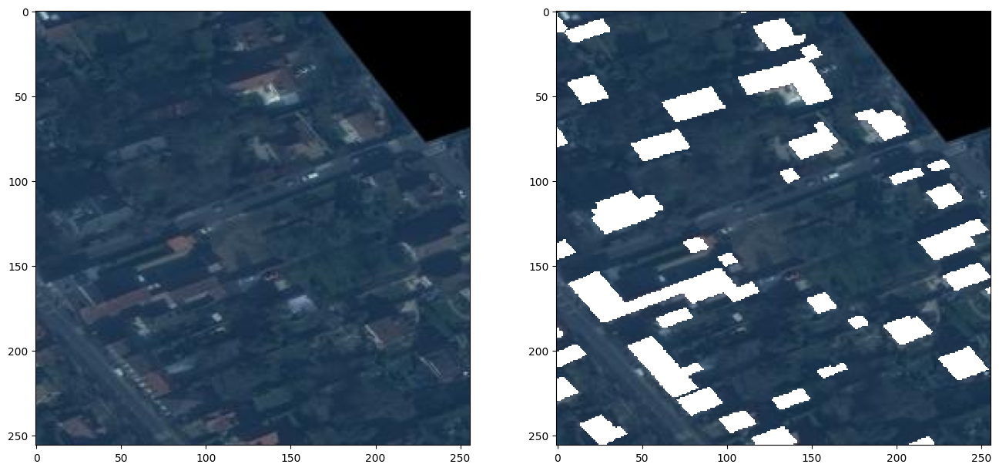

In [22]:

image_id = 124
print(df_path_Paris.iloc[image_id])
# image = cv2.imread(df_path['image'].iloc[image_id])
image = imageio.imread(df_path_Paris["image"].iloc[image_id])
mask = cv2.imread(df_path_Paris["mask"].iloc[image_id], cv2.IMREAD_GRAYSCALE)
mask = np.array(mask)
image = np.array(image)
print(mask.shape)
print(image.shape)
plotImMask(image, mask)

In [23]:
#NUM = len(df_path_Paris) This is too much for Google Colab
image_dataset_Paris = []
mask_dataset_Paris = []

for image_id in range(0,50):
    image = imageio.imread(df_path_Paris["image"].iloc[image_id])
    mask = cv2.imread(df_path_Paris["mask"].iloc[image_id], cv2.IMREAD_GRAYSCALE)

    if mask is not None and mask is not None:

        if np.max(mask) != 0:
            mask = np.array(mask)
            image = np.array(image)
            image_dataset_Paris.append(image)
            mask_dataset_Paris.append(mask)
print(len(image_dataset_Paris))

50


In [24]:
#Just checking
print(image_dataset_Paris[0].shape)
print(mask_dataset_Paris[0].shape)
image_dataset_Paris = np.array(image_dataset_Paris)
mask_dataset_Paris = np.array(mask_dataset_Paris)
print(type(image_dataset_Paris))

print(mask_dataset_Paris.shape)
print(image_dataset_Paris.shape)

(256, 256, 3)
(256, 256)
<class 'numpy.ndarray'>
(50, 256, 256)
(50, 256, 256, 3)


In [25]:
# This line from https://github.com/bnsreenu/python_for_microscopists/blob/master/204_train_simple_unet_for_mitochondria.py
# Adding one dimension for the label on the 2D mask dataset
mask_dataset_Paris = (
    np.expand_dims((np.array(mask_dataset_Paris)), 3) / 255.0
)  # for normalization 0 or 1

In [26]:
# Checking the shape of mask database
print(mask_dataset_Paris.shape)

(50, 256, 256, 1)


In [27]:
# Train test split

image_dataset_Paris = np.array(image_dataset_Paris)
mask_dataset_Paris = np.array(mask_dataset_Paris)

from sklearn.model_selection import train_test_split

X_train_Paris, X_test_Paris, y_train_Paris, y_test_Paris = train_test_split(image_dataset_Paris, mask_dataset_Paris, test_size=0.15)

print(X_train_Paris.shape)
print(X_test_Paris.shape)
print(y_train_Paris.shape)
print(y_test_Paris.shape)

(42, 256, 256, 3)
(8, 256, 256, 3)
(42, 256, 256, 1)
(8, 256, 256, 1)


(17, 256, 256, 3)
(17, 256, 256, 1)
(17, 256, 256, 3)
(17, 256, 256, 1)


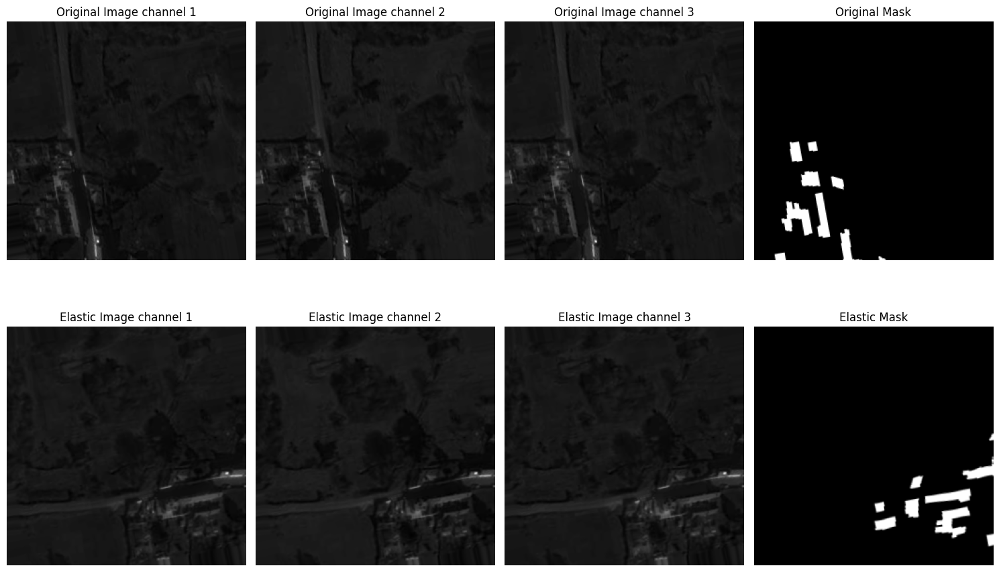

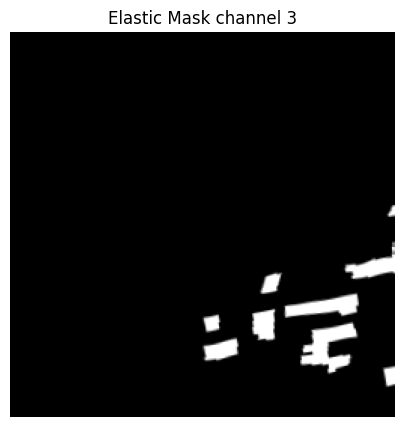

In [ ]:
#This cell is only for testing. This cell is not for the final version
# Define data augmentation parameters
#For satellite pictures with the goal of object-detection, it is recommended the following input parameters
# 5 o 7 for Sigma:
#These values produce smooth deformations that mimic natural variations in satellite images, such as atmospheric effects or slight geometric distortions from cameras.
#30 to 50 for alpha:
#These values provide moderate distortions that are strong enough to train the model to be robust against such variations but not so strong that they appear unnatural.


# Parameter ranges for satellite images
elastic_deformation_sigma_range = [5, 6, 7]
alpha_range = [30, 40, 50]

# Randomly select sigma and alpha within the provided ranges
sigma_random = random.choice(elastic_deformation_sigma_range)
alpha_random = random.choice(alpha_range)

rotation_range = 90
#horizontal_flip = True
#vertical_flip = True
batch_size = len(X_train_Paris)

gen = custom_data_generator(X_train_Paris, y_train_Paris, batch_size, sigma_random, alpha_random, rotation_range, horizontal_flip=True, vertical_flip=True)

#
X_train_Paris_original = []
y_train_Paris_original = []
X_train_Paris_augmented = []
y_train_Paris_augmented = []

#
for X_batch, y_batch, X_batch_deformed, y_batch_deformed in gen:
    X_train_Paris_original.append(X_batch)
    y_train_Paris_original.append(y_batch)
    X_train_Paris_augmented.append(X_batch_deformed)
    y_train_Paris_augmented.append(y_batch_deformed)
    break

#
X_train_Paris_original = np.concatenate(X_train_Paris_original, axis=0)
y_train_Paris_original = np.concatenate(y_train_Paris_original, axis=0)
X_train_Paris_augmented = np.concatenate(X_train_Paris_augmented, axis=0)
y_train_Paris_augmented = np.concatenate(y_train_Paris_augmented, axis=0)

#
print(X_train_Paris_original.shape)
print(y_train_Paris_original.shape)
print(X_train_Paris_augmented.shape)
print(y_train_Paris_augmented.shape)

#
num_images_to_display = 1

for i in range(num_images_to_display):
    num_channels_original = X_train_Paris_original.shape[3]
    num_channels_augmented = X_train_Paris_augmented.shape[3]

    num_subplots_original = min(num_channels_original, 4)
    num_subplots_augmented = min(num_channels_augmented, 4)

    plt.figure(figsize=(15, 10))

    # Original Image und Mask
    for channel in range(num_subplots_original):
        plt.subplot(2, 4, channel + 1)
        plt.imshow(X_train_Paris_original[i][:, :, channel], cmap='gray')
        plt.title(f'Original Image channel {channel + 1}')
        plt.axis('off')

    plt.subplot(2, 4, num_subplots_original + 1)
    plt.imshow(y_train_Paris_original[i], cmap='gray')
    plt.title('Original Mask')
    plt.axis('off')

    # Augmented Image und Mask
    subplot_index_augmented = num_subplots_original + 2
    for channel in range(num_subplots_augmented):
        subplot_index = subplot_index_augmented + channel
        if subplot_index <= 8:  # Stellen Sie sicher, dass der Index im gültigen Bereich liegt
            plt.subplot(2, 4, subplot_index)
            plt.imshow(X_train_Paris_augmented[i][:, :, channel], cmap='gray')
            plt.title(f'Elastic Image channel {channel + 1}')
            plt.axis('off')

    subplot_index = subplot_index_augmented + num_subplots_augmented
    if subplot_index <= 8:  # Stellen Sie sicher, dass der Index im gültigen Bereich liegt
        plt.subplot(2, 4, subplot_index)
        plt.imshow(y_train_Paris_augmented[i], cmap='gray')
        plt.title('Elastic Mask')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

for i in range(num_images_to_display):
  plt.figure(figsize=(5, 5))
  plt.imshow(y_train_Paris_augmented[i], cmap='gray')
  plt.title(f'Elastic Mask channel {channel + 1}')
  plt.axis('off')
  plt.show()

(17, 256, 256, 3)
(17, 256, 256, 1)
(17, 256, 256, 3)
(17, 256, 256, 1)


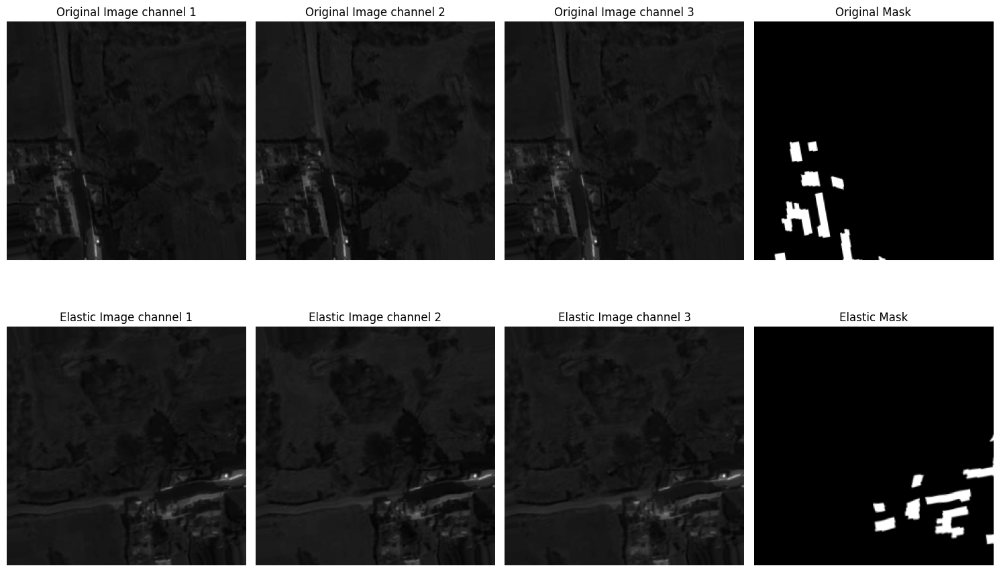

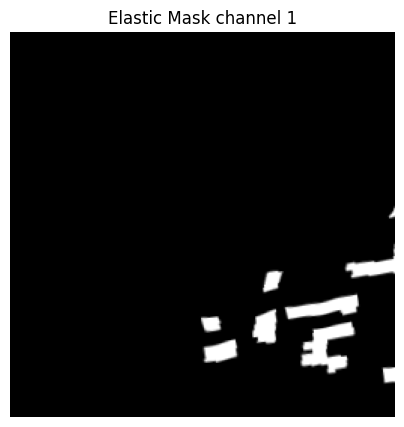

In [ ]:
#This cell is only for testing. This cell is not for the final version
#Slightly improved.
import random
import numpy as np
import matplotlib.pyplot as plt

# Define data augmentation parameters
# For satellite images with the goal of object detection, the following input parameters are recommended:
# Sigma: 5 to 7 - These values produce smooth deformations that mimic natural variations in satellite images,
# such as atmospheric effects or slight geometric distortions from cameras.
# Alpha: 30 to 50 - These values provide moderate distortions that are strong enough to train the model to be robust against such variations
# but not so strong that they appear unnatural.

# Parameter ranges for satellite images
elastic_deformation_sigma_range = [5, 6, 7]
alpha_range = [30, 40, 50]

# Randomly select sigma and alpha within the provided ranges
sigma_random = random.choice(elastic_deformation_sigma_range)
alpha_random = random.choice(alpha_range)

rotation_range = 90
batch_size = len(X_train_Paris)

# Assuming `custom_data_generator` is a function that generates augmented data
gen = custom_data_generator(X_train_Paris, y_train_Paris, batch_size, sigma_random, alpha_random, rotation_range, horizontal_flip=True, vertical_flip=True)

# Lists to hold original and augmented data
X_train_Paris_original = []
y_train_Paris_original = []
X_train_Paris_augmented = []
y_train_Paris_augmented = []

# Generate and store one batch of augmented data
for X_batch, y_batch, X_batch_deformed, y_batch_deformed in gen:
    X_train_Paris_original.append(X_batch)
    y_train_Paris_original.append(y_batch)
    X_train_Paris_augmented.append(X_batch_deformed)
    y_train_Paris_augmented.append(y_batch_deformed)
    break

# Concatenate lists into arrays
X_train_Paris_original = np.concatenate(X_train_Paris_original, axis=0)
y_train_Paris_original = np.concatenate(y_train_Paris_original, axis=0)
X_train_Paris_augmented = np.concatenate(X_train_Paris_augmented, axis=0)
y_train_Paris_augmented = np.concatenate(y_train_Paris_augmented, axis=0)

# Print shapes of the original and augmented data
print(X_train_Paris_original.shape)
print(y_train_Paris_original.shape)
print(X_train_Paris_augmented.shape)
print(y_train_Paris_augmented.shape)

# Number of images to display
num_images_to_display = 1

for i in range(num_images_to_display):
    num_channels_original = X_train_Paris_original.shape[3]
    num_channels_augmented = X_train_Paris_augmented.shape[3]

    num_subplots_original = min(num_channels_original, 4)
    num_subplots_augmented = min(num_channels_augmented, 4)

    plt.figure(figsize=(15, 10))

    # Display original images and masks
    for channel in range(num_subplots_original):
        plt.subplot(2, 4, channel + 1)
        plt.imshow(X_train_Paris_original[i][:, :, channel], cmap='gray')
        plt.title(f'Original Image channel {channel + 1}')
        plt.axis('off')

    plt.subplot(2, 4, num_subplots_original + 1)
    plt.imshow(y_train_Paris_original[i], cmap='gray')
    plt.title('Original Mask')
    plt.axis('off')

    # Display augmented images and masks
    subplot_index_augmented = num_subplots_original + 2
    for channel in range(num_subplots_augmented):
        subplot_index = subplot_index_augmented + channel
        if subplot_index <= 8:  # Ensure the index is within the valid range
            plt.subplot(2, 4, subplot_index)
            plt.imshow(X_train_Paris_augmented[i][:, :, channel], cmap='gray')
            plt.title(f'Elastic Image channel {channel + 1}')
            plt.axis('off')

    subplot_index = subplot_index_augmented + num_subplots_augmented
    if subplot_index <= 8:  # Ensure the index is within the valid range
        plt.subplot(2, 4, subplot_index)
        plt.imshow(y_train_Paris_augmented[i], cmap='gray')
        plt.title('Elastic Mask')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Display only augmented masks
for i in range(num_images_to_display):
    plt.figure(figsize=(5, 5))
    plt.imshow(y_train_Paris_augmented[i], cmap='gray')
    plt.title(f'Elastic Mask channel {i + 1}')  # Corrected title to show the correct image index
    plt.axis('off')
    plt.show()

(17, 256, 256, 3)
(17, 256, 256, 1)
(17, 256, 256, 3)
(17, 256, 256, 1)
subplot_index 5
subplot_index 6
subplot_index 7


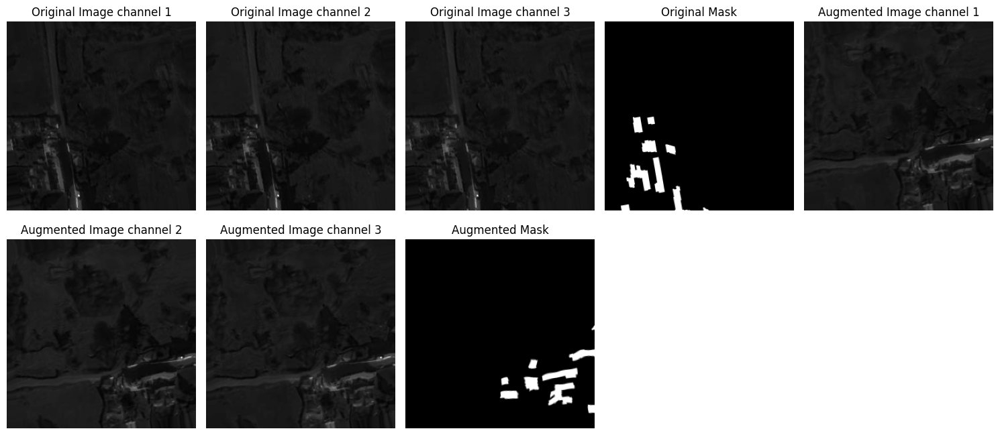

subplot_index 5
subplot_index 6
subplot_index 7


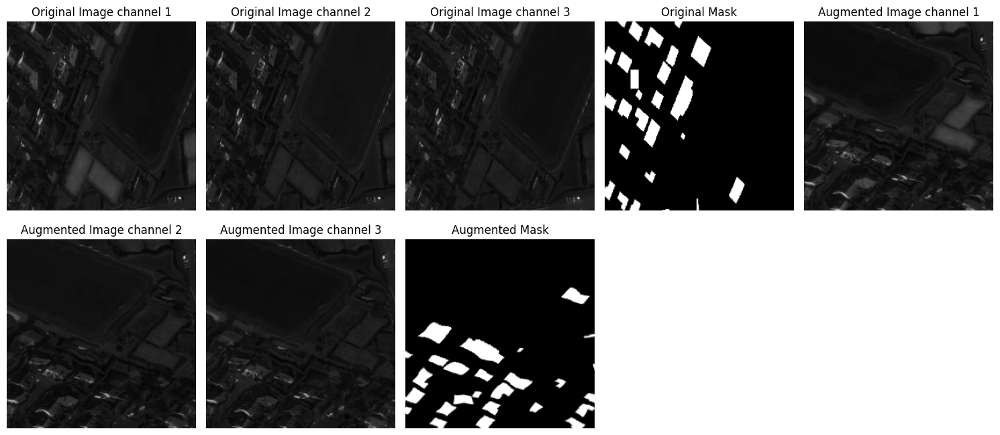

subplot_index 5
subplot_index 6
subplot_index 7


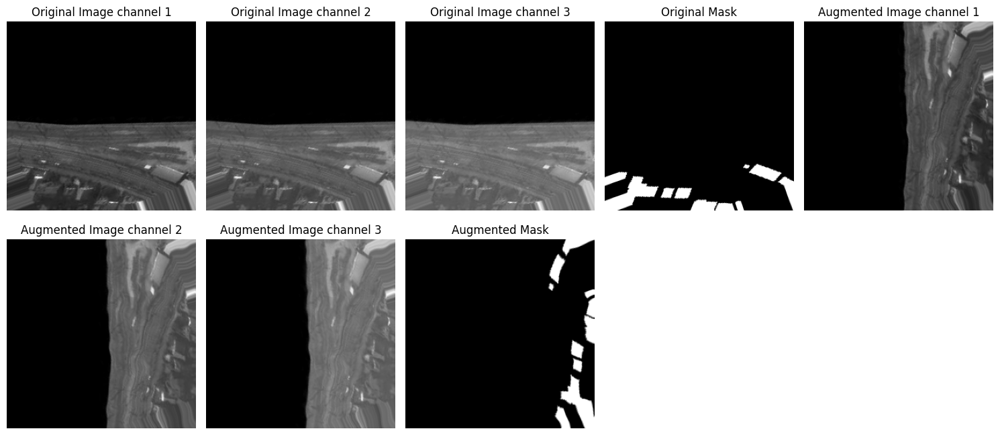

subplot_index 5
subplot_index 6
subplot_index 7


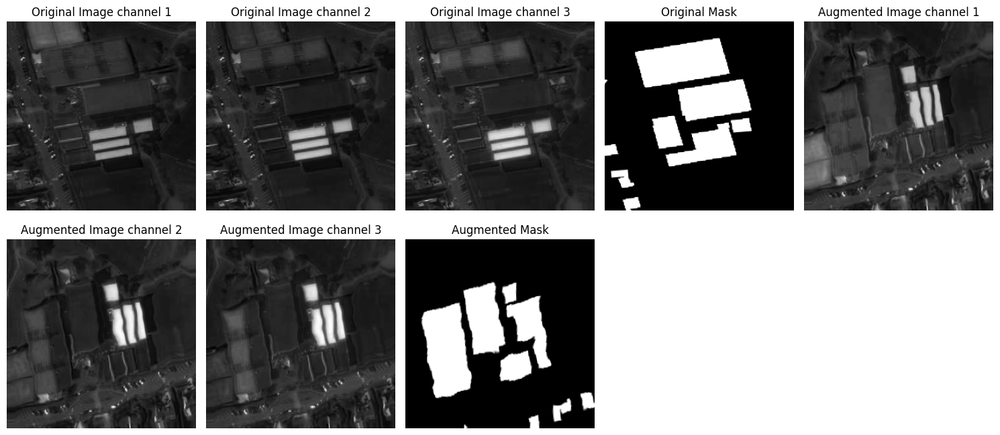

subplot_index 5
subplot_index 6
subplot_index 7


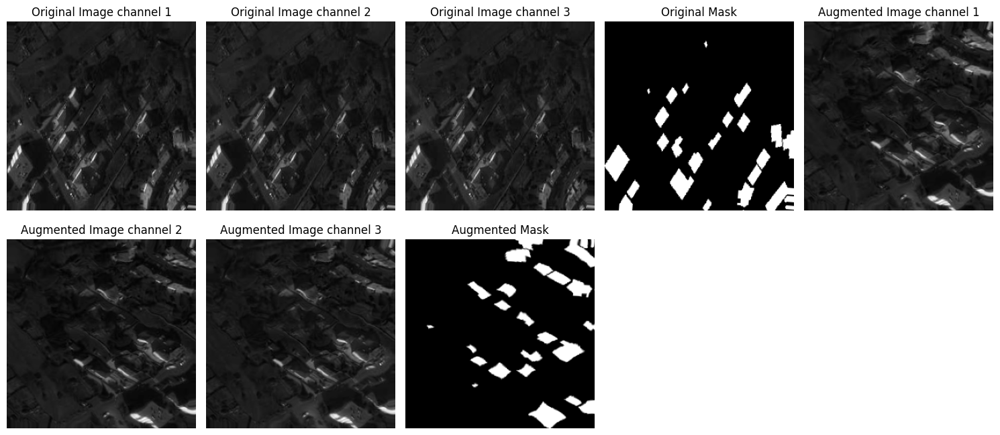

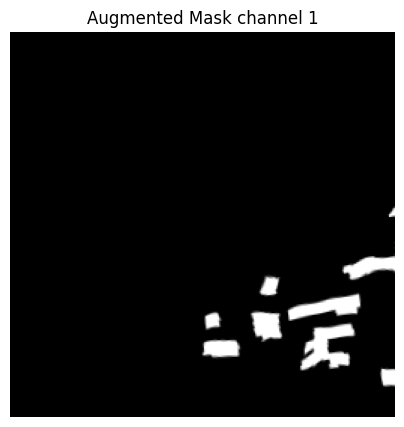

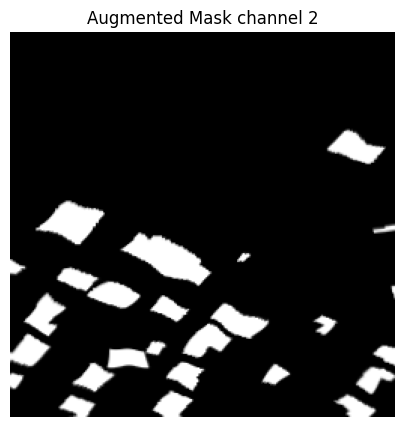

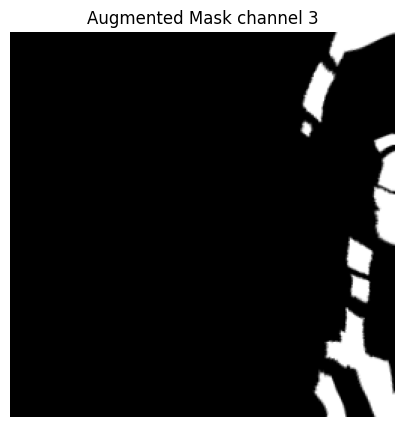

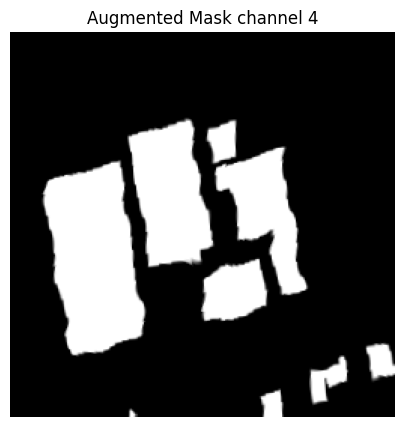

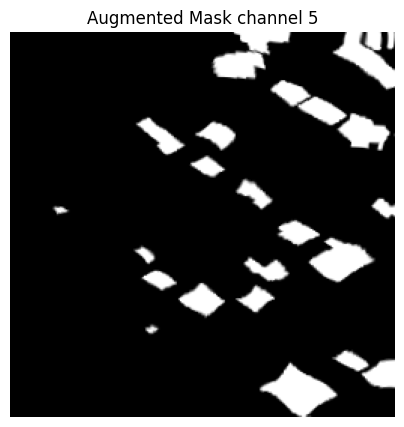

In [ ]:
#This cell is only for testing. This cell is not for the final version
import random
import numpy as np
import matplotlib.pyplot as plt

# Define data augmentation parameters
# For satellite images with the goal of object detection, the following input parameters are recommended:
# Sigma: 5 to 7 - These values produce smooth deformations that mimic natural variations in satellite images,
# such as atmospheric effects or slight geometric distortions from cameras.
# Alpha: 30 to 50 - These values provide moderate distortions that are strong enough to train the model to be robust against such variations
# but not so strong that they appear unnatural.

# Parameter ranges for satellite images
elastic_deformation_sigma_range = [5, 6, 7]
alpha_range = [30, 40, 50]

# Randomly select sigma and alpha within the provided ranges
sigma_random = random.choice(elastic_deformation_sigma_range)
alpha_random = random.choice(alpha_range)

rotation_range = 90
batch_size = len(X_train_Paris)

# Assuming `custom_data_generator` is a function that generates augmented data
gen = custom_data_generator(X_train_Paris, y_train_Paris, batch_size, sigma_random, alpha_random, rotation_range, horizontal_flip=True, vertical_flip=True)

# Lists to hold original and augmented data
X_train_Paris_original = []
y_train_Paris_original = []
X_train_Paris_augmented = []
y_train_Paris_augmented = []

# Generate and store one batch of augmented data
for X_batch, y_batch, X_batch_deformed, y_batch_deformed in gen:
    X_train_Paris_original.append(X_batch)
    y_train_Paris_original.append(y_batch)
    X_train_Paris_augmented.append(X_batch_deformed)
    y_train_Paris_augmented.append(y_batch_deformed)
    break

# Concatenate lists into arrays
X_train_Paris_original = np.concatenate(X_train_Paris_original, axis=0)
y_train_Paris_original = np.concatenate(y_train_Paris_original, axis=0)
X_train_Paris_augmented = np.concatenate(X_train_Paris_augmented, axis=0)
y_train_Paris_augmented = np.concatenate(y_train_Paris_augmented, axis=0)

# Print shapes of the original and augmented data
print(X_train_Paris_original.shape)
print(y_train_Paris_original.shape)
print(X_train_Paris_augmented.shape)
print(y_train_Paris_augmented.shape)

# Number of images to display
num_images_to_display = 5

for i in range(num_images_to_display):
    num_channels_original = X_train_Paris_original.shape[3]
    num_channels_augmented = X_train_Paris_augmented.shape[3]

    num_subplots_original = min(num_channels_original, 8)
    num_subplots_augmented = min(num_channels_augmented, 8)

    plt.figure(figsize=(15, 10))

    # Display original images and masks
    for channel in range(num_subplots_original):
        plt.subplot(3, 5, channel + 1)
        plt.imshow(X_train_Paris_original[i][:, :, channel], cmap='gray')
        plt.title(f'Original Image channel {channel + 1}')
        plt.axis('off')

    plt.subplot(3, 5, num_subplots_original + 1)
    plt.imshow(y_train_Paris_original[i], cmap='gray')
    plt.title('Original Mask')
    plt.axis('off')

    # Display augmented images and masks
    subplot_index_augmented = num_subplots_original + 2
    for channel in range(num_subplots_augmented):
        subplot_index = subplot_index_augmented + channel
        print('subplot_index',subplot_index)
        if subplot_index <= 15:  # Ensure the index is within the valid range
          plt.subplot(3, 5, subplot_index)
          plt.imshow(X_train_Paris_augmented[i][:, :, channel], cmap='gray')
          plt.title(f'Augmented Image channel {channel + 1}')
          plt.axis('off')

    subplot_index = subplot_index_augmented + num_subplots_augmented
    if subplot_index <= 15:  # Ensure the index is within the valid range
        plt.subplot(3, 5, subplot_index)
        plt.imshow(y_train_Paris_augmented[i], cmap='gray')
        plt.title('Augmented Mask')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Display only augmented masks
for i in range(num_images_to_display):
    plt.figure(figsize=(5, 5))
    plt.imshow(y_train_Paris_augmented[i], cmap='gray')
    plt.title(f'Augmented Mask channel {i + 1}')  # Corrected title to show the correct image index
    plt.axis('off')
    plt.show()

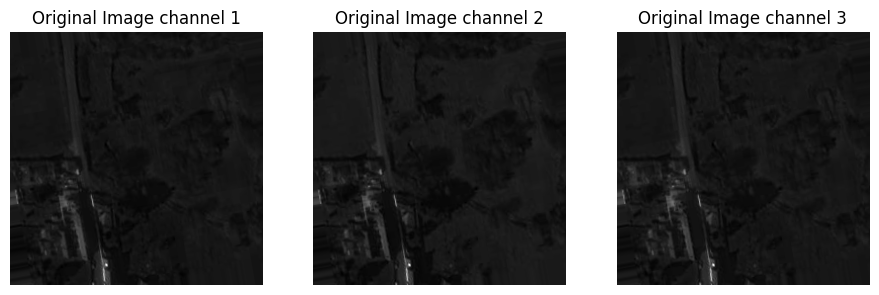

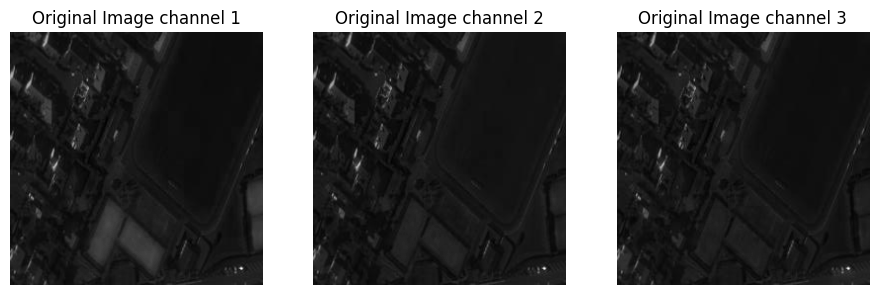

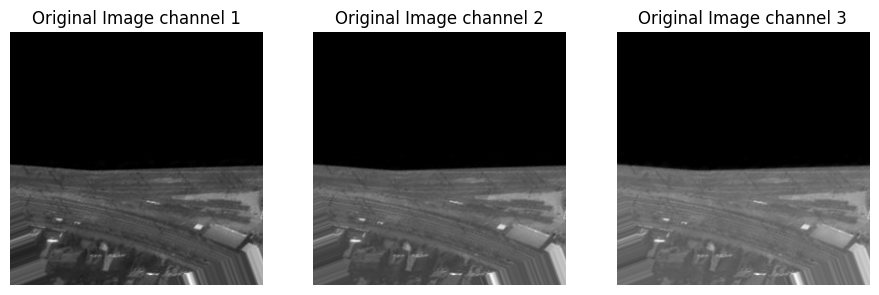

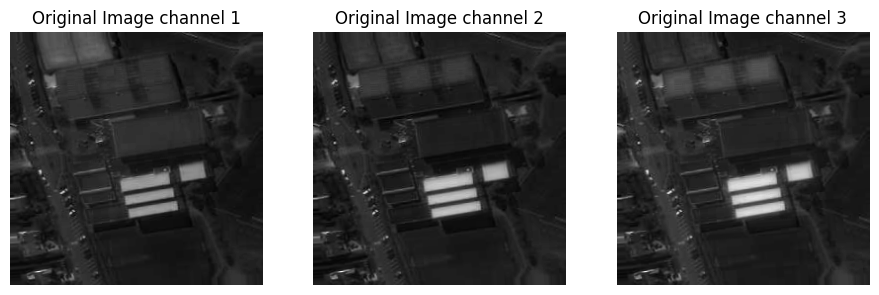

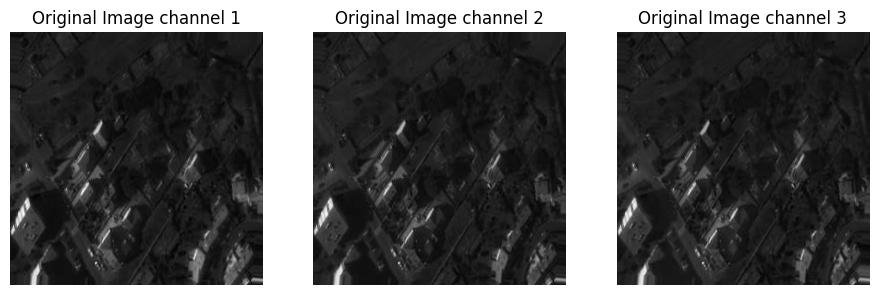

In [ ]:
# Display only Original images

# Parameter ranges for satellite images
elastic_deformation_sigma_range = [5, 6, 7]
alpha_range = [30, 40, 50]

# Randomly select sigma and alpha within the provided ranges
sigma_random = random.choice(elastic_deformation_sigma_range)
alpha_random = random.choice(alpha_range)

rotation_range = 90
batch_size = len(X_train_Paris)

# Assuming `custom_data_generator` is a function that generates augmented data
gen = custom_data_generator(X_train_Paris, y_train_Paris, batch_size, sigma_random, alpha_random, rotation_range, horizontal_flip=True, vertical_flip=True)

# Lists to hold original and augmented data
X_train_Paris_original = []
y_train_Paris_original = []
X_train_Paris_augmented = []
y_train_Paris_augmented = []

# Number of images to display
num_images_to_display = 5


# Generate and store one batch of augmented data
for X_batch, y_batch, X_batch_deformed, y_batch_deformed in gen:
    X_train_Paris_original.append(X_batch)
    y_train_Paris_original.append(y_batch)
    X_train_Paris_augmented.append(X_batch_deformed)
    y_train_Paris_augmented.append(y_batch_deformed)
    break

# Concatenate lists into arrays
X_train_Paris_original = np.concatenate(X_train_Paris_original, axis=0)
y_train_Paris_original = np.concatenate(y_train_Paris_original, axis=0)
X_train_Paris_augmented = np.concatenate(X_train_Paris_augmented, axis=0)
y_train_Paris_augmented = np.concatenate(y_train_Paris_augmented, axis=0)


#Simple, but true. This cell is easier to follow and does not have errors.
for i in range(num_images_to_display):
  plt.figure(figsize=(15, 10))

  num_channels_original = X_train_Paris_original.shape[3]
  num_channels_augmented = X_train_Paris_augmented.shape[3]

  num_subplots_original = min(num_channels_original, 8)
  num_subplots_augmented = min(num_channels_augmented, 8)
  for channel in range(num_subplots_original):
    plt.subplot(2,4,channel+1)
    plt.imshow(X_train_Paris_original[i][:, :, channel], cmap='gray')
    plt.title(f'Original Image channel {channel + 1}')
    plt.axis('off')

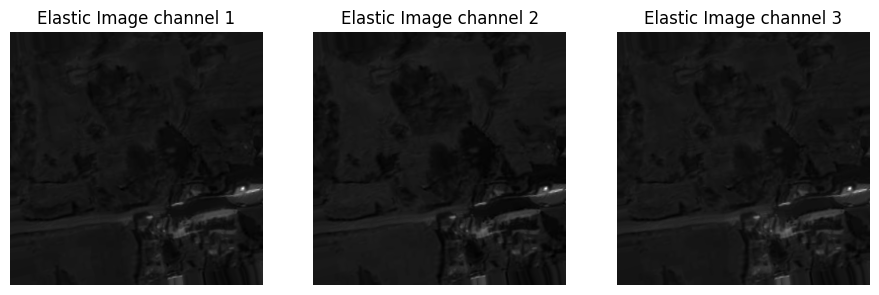

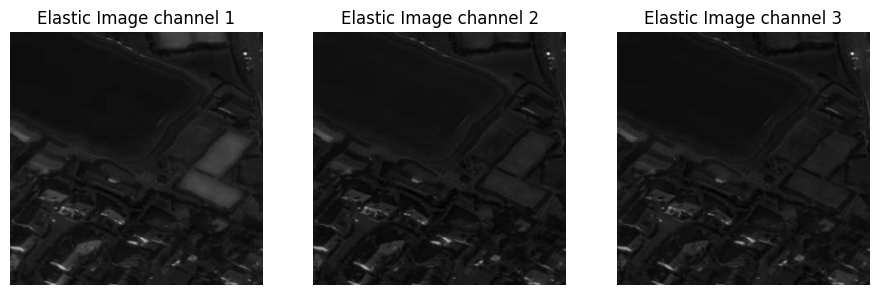

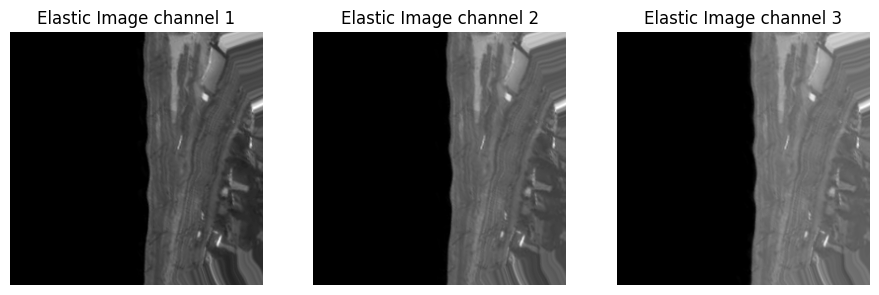

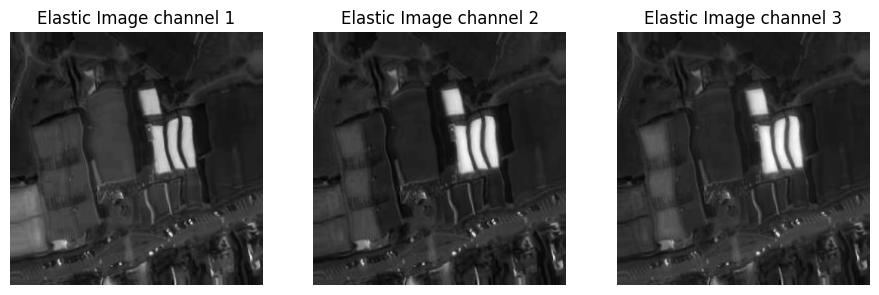

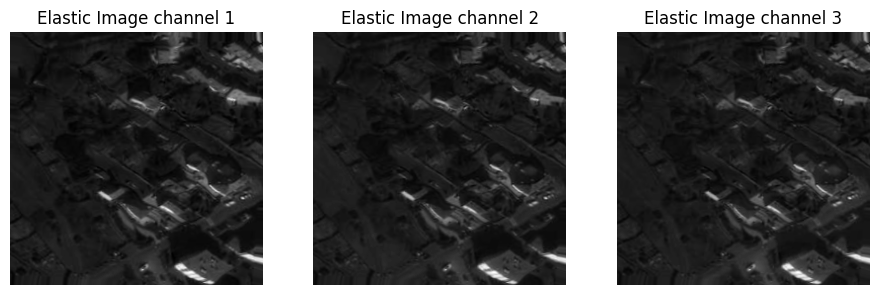

In [ ]:
# Display only Elastic images
for i in range(num_images_to_display):
  plt.figure(figsize=(15, 10))
  for channel in range(num_subplots_augmented):
    plt.subplot(2,4,channel+1)
    plt.imshow(X_train_Paris_augmented[i][:, :, channel], cmap='gray')
    plt.title(f'Elastic Image channel {channel + 1}')
    plt.axis('off')

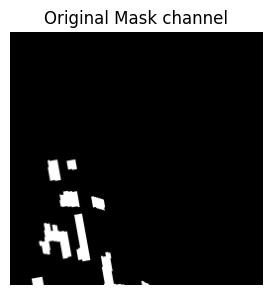

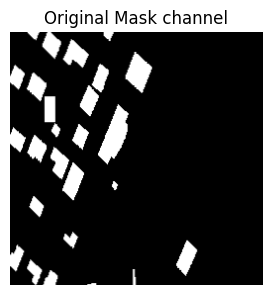

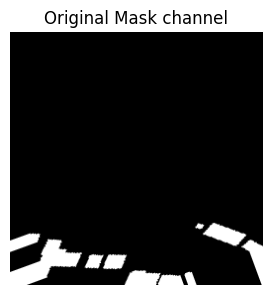

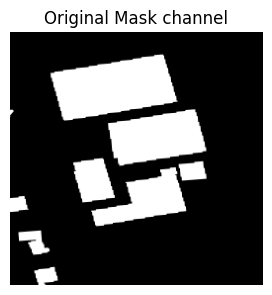

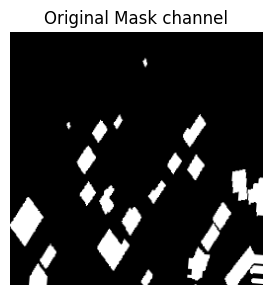

In [ ]:
# Display only Original mask
for i in range(num_images_to_display):
  plt.figure(figsize=(15, 10))
  #for channel in range(num_subplots_original):
  plt.subplot(2,4,channel+1)
    #plt.imshow(y_train_Paris8_augmented[i][:, :, channel], cmap='gray')
  plt.imshow(y_train_Paris_original[i], cmap='gray')
  plt.title(f'Original Mask channel')
  plt.axis('off')

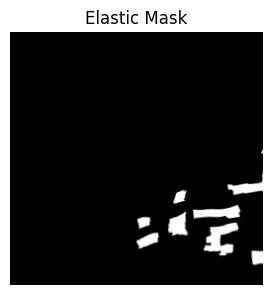

In [ ]:
# Display only elastic masks
for i in range(num_images_to_display):
  plt.figure(figsize=(15, 10))
  #for channel in range(num_subplots_augmented):
  plt.subplot(2,4,channel+1)
  plt.imshow(y_train_Paris_augmented[i], cmap='gray')
  plt.title(f'Elastic Mask')
  plt.axis('off')

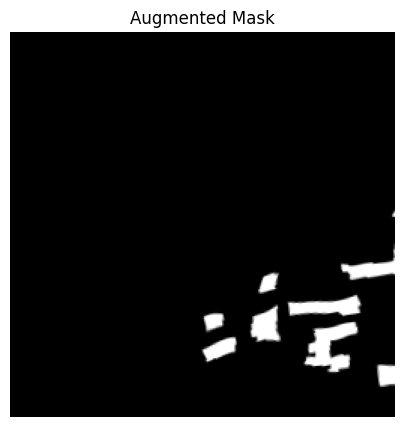

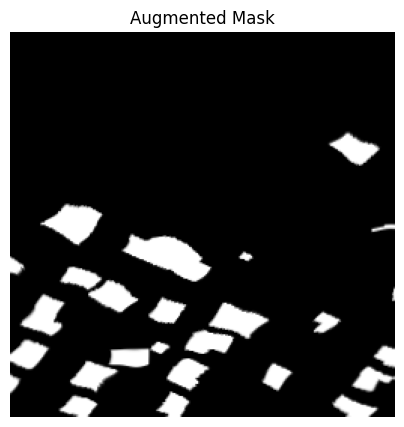

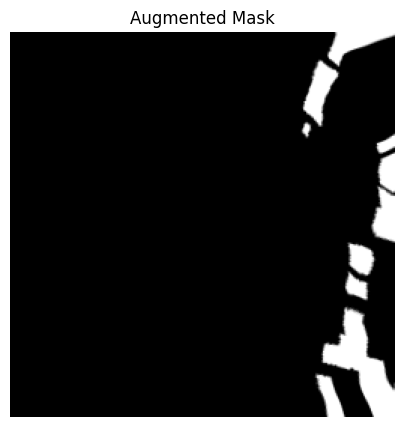

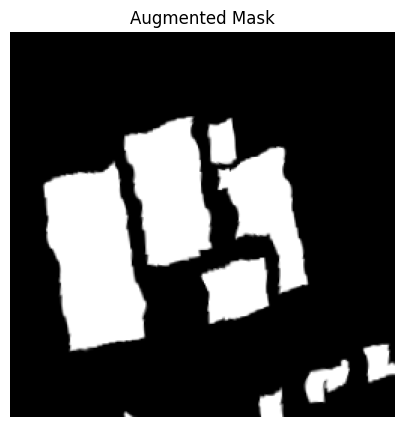

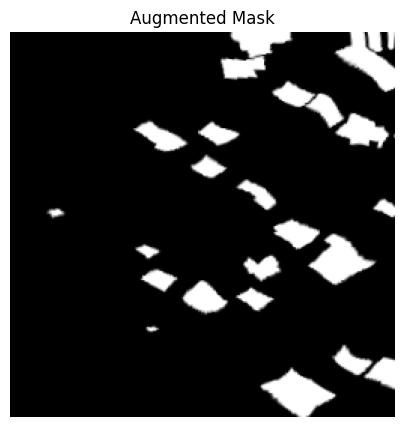

In [ ]:
# Just for checking.
num_masks_to_display = 5

for i in range(num_masks_to_display):
    plt.figure(figsize=(5, 5))
    plt.imshow(y_train_Paris_augmented[i], cmap='gray')
    plt.title('Augmented Mask')
    plt.axis('off')
    plt.show()

(42, 256, 256, 3)
(42, 256, 256, 1)
(42, 256, 256, 3)
(42, 256, 256, 1)


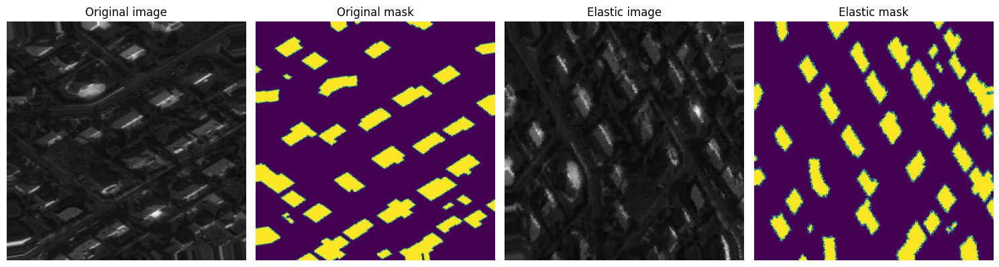

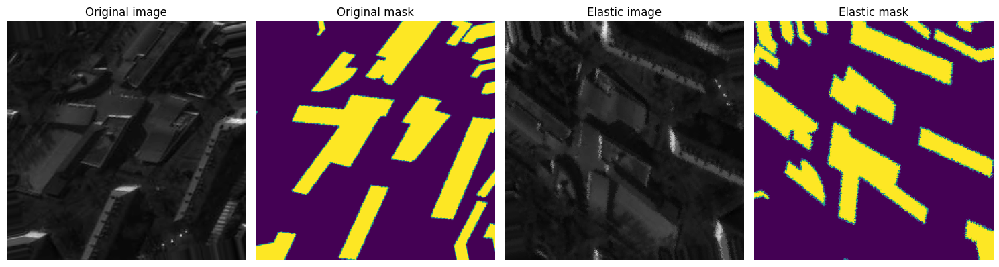

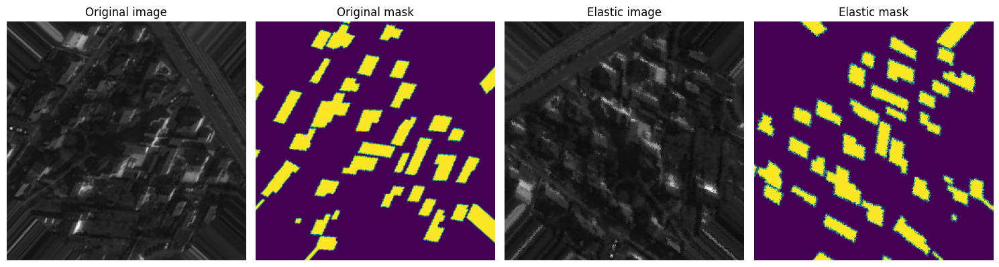

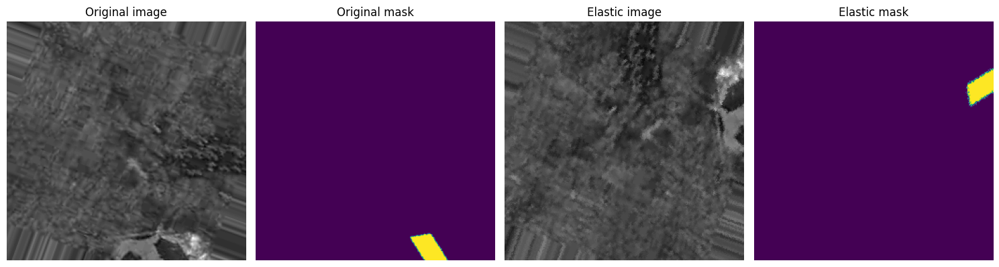

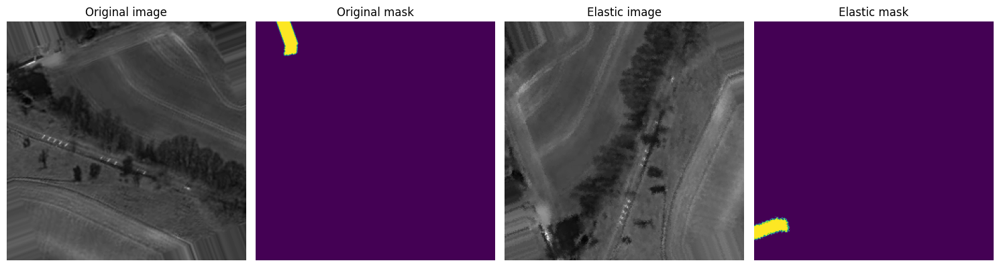

In [31]:
# Define data augmentation parameters
#For satellite pictures with the goal of object-detection, it is recommended the following input parameters
# 5 o 7 for Sigma:
#These values produce smooth deformations that mimic natural variations in satellite images, such as atmospheric effects or slight geometric distortions from cameras.
#30 to 50 for alpha:
#These values provide moderate distortions that are strong enough to train the model to be robust against such variations but not so strong that they appear unnatural.

# Parameter ranges for satellite images
elastic_deformation_sigma_range =[0.1, 0.5, 1] # Change it from 5, 6, 7 to 1, 2, 3
alpha_range = [0.1, 0.5, 1] #change it from 30, 40, 50 to 5, 10, 15

# Randomly select sigma and alpha within the provided ranges
sigma_random = random.choice(elastic_deformation_sigma_range)
alpha_random = random.choice(alpha_range)

rotation_range = 90
#horizontal_flip = True
#vertical_flip = True
batch_size = len(X_train_Paris)

gen = custom_data_generator(X_train_Paris, y_train_Paris, batch_size, sigma_random, alpha_random, rotation_range, horizontal_flip=True, vertical_flip=True)
#
X_train_Paris_original = []
y_train_Paris_original = []
X_train_Paris_augmented = []
y_train_Paris_augmented = []

#
for X_batch, y_batch, X_batch_deformed, y_batch_deformed in gen:
    X_train_Paris_original.append(X_batch)
    y_train_Paris_original.append(y_batch)
    X_train_Paris_augmented.append(X_batch_deformed)
    y_train_Paris_augmented.append(y_batch_deformed)
    break

#
X_train_Paris_original = np.concatenate(X_train_Paris_original, axis=0)
y_train_Paris_original = np.concatenate(y_train_Paris_original, axis=0)
X_train_Paris_augmented = np.concatenate(X_train_Paris_augmented, axis=0)
y_train_Paris_augmented = np.concatenate(y_train_Paris_augmented, axis=0)

#
print(X_train_Paris_original.shape)
print(y_train_Paris_original.shape)
print(X_train_Paris_augmented.shape)
print(y_train_Paris_augmented.shape)

#
num_images_to_display = 5

#
for i in range(num_images_to_display):
    #
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 4, 1)
    #plt.imshow(X_train_Paris_original[i])
    plt.imshow(X_train_Paris_original[i][:, :, 1], cmap='gray')
    #
    plt.title('Original image')
    plt.axis('off')

    plt.subplot(2, 4, 2)
    plt.imshow(y_train_Paris_original[i])
    plt.title('Original mask')
    plt.axis('off')

    #
    plt.subplot(2, 4, 3)
    plt.imshow(X_train_Paris_augmented[i][:, :, 1], cmap='gray')
    plt.title('Elastic image')
    plt.axis('off')

    plt.subplot(2, 4, 4)
    plt.imshow(y_train_Paris_augmented[i])
    plt.title('Elastic mask')
    plt.axis('off')

    #
    plt.tight_layout()
    plt.show()

In [32]:
#The segmentation-models package is a powerful and flexible library designed to simplify the process of building and using deep learning models for image segmentation.
#By providing pre-built architectures, backbone networks, loss functions, metrics, and preprocessing utilities, it enables quick experimentation and efficient development of high-performance segmentation models.
!pip install -U segmentation-models

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.8 MB/s eta 0:00:00


In [33]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Conv2DTranspose
from keras.layers import concatenate, BatchNormalization, Dropout, Lambda
from keras import backend as K

In [34]:
def jaccard_coef(y_true, y_pred):
  """
  Compute the Jaccard coefficient, also known as the Intersection over Union (IoU),
  between the ground truth labels and the predicted labels.

  Parameters:
  y_true (tensor): Ground truth binary labels.
  y_pred (tensor): Predicted binary labels.

  Returns:
  tensor: Jaccard coefficient (IoU) value.
  """
  # Flatten the tensors to create 1D arrays
  y_true_flatten = K.flatten(y_true)
  y_pred_flatten = K.flatten(y_pred)

  # Compute the intersection: element-wise multiplication and then summation
  intersection = K.sum(y_true_flatten * y_pred_flatten)

  # Compute the Jaccard coefficient
  # Add a small constant (1.0) to the numerator and denominator to avoid division by zero
  final_coef_value = (intersection + 1.0) / (K.sum(y_true_flatten) + K.sum(y_pred_flatten) - intersection + 1.0)

  return final_coef_value

In [35]:
def binary_unet_model(image_height=256, image_width=256, image_channels=3):
  """
  Builds a U-Net model for binary image segmentation.

  Parameters:
  image_height (int): Height of the input image.
  image_width (int): Width of the input image.
  image_channels (int): Number of channels in the input image.

  Returns:
  model (tf.keras.Model): Compiled U-Net model.
  """

  # Input layer
  inputs = Input((image_height, image_width, image_channels))

  # Encoder path
  source_input = inputs

  # First convolutional block
  c1 = Conv2D(16, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(source_input)
  c1 = Dropout(0.2)(c1)
  c1 = Conv2D(16, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(c1)
  p1 = MaxPooling2D((2,2))(c1)

  # Second convolutional block
  c2 = Conv2D(32, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(p1)
  c2 = Dropout(0.2)(c2)
  c2 = Conv2D(32, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(c2)
  p2 = MaxPooling2D((2,2))(c2)

  # Third convolutional block
  c3 = Conv2D(64, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(p2)
  c3 = Dropout(0.2)(c3)
  c3 = Conv2D(64, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(c3)
  p3 = MaxPooling2D((2,2))(c3)

  # Fourth convolutional block
  c4 = Conv2D(128, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(p3)
  c4 = Dropout(0.2)(c4)
  c4 = Conv2D(128, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(c4)
  p4 = MaxPooling2D((2,2))(c4)

  # Fifth convolutional block (bottleneck)
  c5 = Conv2D(256, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(p4)
  c5 = Dropout(0.2)(c5)
  c5 = Conv2D(256, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(c5)

  # Decoder path with upsampling and concatenation

  # First upsampling block
  u6 = Conv2DTranspose(128, (2,2), strides=(2,2), padding="same")(c5)
  u6 = concatenate([u6, c4])
  c6 = Conv2D(128, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(u6)
  c6 = Dropout(0.2)(c6)
  c6 = Conv2D(128, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(c6)

  # Second upsampling block
  u7 = Conv2DTranspose(64, (2,2), strides=(2,2), padding="same")(c6)
  u7 = concatenate([u7, c3])
  c7 = Conv2D(64, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(u7)
  c7 = Dropout(0.2)(c7)
  c7 = Conv2D(64, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(c7)

  # Third upsampling block
  u8 = Conv2DTranspose(32, (2,2), strides=(2,2), padding="same")(c7)
  u8 = concatenate([u8, c2])
  c8 = Conv2D(32, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(u8)
  c8 = Dropout(0.2)(c8)
  c8 = Conv2D(32, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(c8)

  # Fourth upsampling block
  u9 = Conv2DTranspose(16, (2,2), strides=(2,2), padding="same")(c8)
  u9 = concatenate([u9, c1], axis=3)
  c9 = Conv2D(16, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(u9)
  c9 = Dropout(0.2)(c9)
  c9 = Conv2D(16, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(c9)

  # Output layer with a single channel for binary classification, using sigmoid activation
  outputs = Conv2D(1, (1,1), activation="sigmoid")(c9)

  # Create the model
  model = Model(inputs=[inputs], outputs=[outputs])
  return model

In [36]:
metrics = ["accuracy", jaccard_coef]

In [37]:
#I need to instantiate the model outside the function
model = binary_unet_model()

In [38]:
def get_deep_learning_model():
    return binary_unet_model()

In [ ]:
#model = get_deep_learning_model()

In [39]:
#To ensure that the segmentation_models package uses TensorFlow's Keras implementation.
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


In [40]:
#This code snippet defines a custom loss function for a segmentation model by combining the Dice loss and Categorical Focal loss.
#Here’s a detailed explanation of each part:
weights = [0.5, 0.5]
dice_loss = sm.losses.DiceLoss(class_weights = weights)
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

In [41]:
import tensorflow as tf

In [42]:
tf.keras.backend.clear_session()

In [43]:
model.compile(optimizer="adam", loss=total_loss, metrics=metrics)# total_loss or binary_crossentropy

In [44]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 16)         448       ['input_1[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 256, 256, 16)         0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 16)         2320      ['dropout[0][0]']             
                                                                                              

In [45]:
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True)

In [46]:
model_history = model.fit(X_train_Paris_augmented, y_train_Paris_augmented,
                          batch_size=16,
                          verbose=1,
                          epochs=75,
                          validation_data=(X_test_Paris, y_test_Paris),
                          shuffle=False,
                          callbacks=[early_stopping]
                          )

Epoch 1/75
3/3 [==============================] - 41s 11s/step - loss: 1.0000 - accuracy: 0.1381 - jaccard_coef: 5.2667e-04 - val_loss: 0.9997 - val_accuracy: 0.0067 - val_jaccard_coef: 2.9344e-04
Epoch 2/75
3/3 [==============================] - 47s 18s/step - loss: 0.9995 - accuracy: 0.0080 - jaccard_coef: 5.3151e-04 - val_loss: 0.9997 - val_accuracy: 3.8338e-04 - val_jaccard_coef: 2.9292e-04
Epoch 3/75
3/3 [==============================] - 34s 10s/step - loss: 0.9995 - accuracy: 0.0014 - jaccard_coef: 5.3188e-04 - val_loss: 0.9997 - val_accuracy: 7.2479e-05 - val_jaccard_coef: 2.9270e-04
Epoch 4/75
3/3 [==============================] - 34s 11s/step - loss: 0.9995 - accuracy: 4.0000e-04 - jaccard_coef: 5.3177e-04 - val_loss: 0.9997 - val_accuracy: 2.0981e-05 - val_jaccard_coef: 2.9255e-04
Epoch 5/75
3/3 [==============================] - 38s 13s/step - loss: 0.9995 - accuracy: 1.7257e-04 - jaccard_coef: 5.3174e-04 - val_loss: 0.9997 - val_accuracy: 1.3351e-05 - val_jaccard_coef: 2.

In [47]:
#Performance check
history_a = model_history

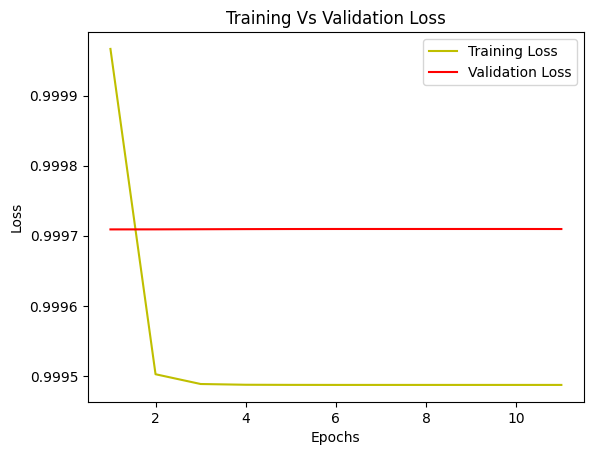

In [48]:
loss = history_a.history['loss']
val_loss = history_a.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label="Training Loss")
plt.plot(epochs, val_loss, 'r', label="Validation Loss")
plt.title("Training Vs Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

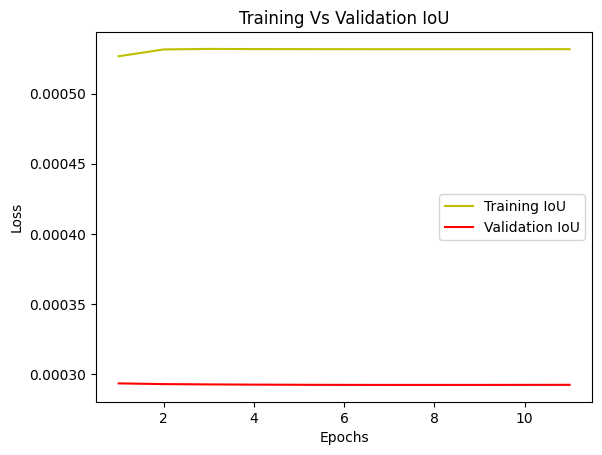

In [49]:
jaccard_coef = history_a.history['jaccard_coef']
val_jaccard_coef = history_a.history['val_jaccard_coef']

epochs = range(1, len(jaccard_coef) + 1)
plt.plot(epochs, jaccard_coef, 'y', label="Training IoU")
plt.plot(epochs, val_jaccard_coef, 'r', label="Validation IoU")
plt.title("Training Vs Validation IoU")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [64]:
threshold = 0.0000000001 # can be adjusted

In [65]:
# Predictions on the whole test data
# from https://github.com/iamtekson/deep-learning-for-earth-observation/blob/main/Notebooks/03.%20image%20segmentation/01.%20Building%20detection/Building_Mapping.ipynb

pred_test = model.predict(X_test_Paris)
pred_test = (pred_test > threshold).astype(np.uint8)

1/1 [==============================] - 1s 1s/step


In [66]:
# make prediction for a single image and display the results

test_image_number = random.randint(0, len(X_test_Paris) -1)

test_image = X_test_Paris[test_image_number]
ground_truth_image = y_test_Paris[test_image_number]

test_image_input = np.expand_dims(test_image, 0)

#prediction = model.predict(test_image_input)
# next line in combination with https://github.com/bnsreenu/python_for_microscopists/blob/master/204_train_simple_unet_for_mitochondria.py
# the value > x can be ajusted
prediction = (model.predict(test_image_input) > threshold).astype(np.uint8)
#predicted_image = np.argmax(prediction, axis=3)
predicted_image = prediction[0,:,:]

1/1 [==============================] - 0s 155ms/step


In [67]:
import os
import random
import matplotlib.pyplot as plt

def save_metrics_image(model, X_test, y_test, threshold, num_images=10, dir_name='metrics_image_test_Paris'):
    if not os.path.exists(f'/content/drive/MyDrive/Colab_Notebooks/Setofimages/{dir_name}'):
        os.makedirs(f'/content/drive/MyDrive/Colab_Notebooks/Setofimages/{dir_name}')

    for i in range(num_images):
        test_image_number = random.randint(0, len(X_test) - 1)
        test_image = X_test[test_image_number]
        ground_truth_image = y_test[test_image_number]

        test_image_input = np.expand_dims(test_image, 0)

        prediction = (model.predict(test_image_input) > threshold).astype(np.uint8)
        predicted_image = prediction[0, :, :]

        # if test_image.ndim == 2:
        #   test_image = np.expand_dims(test_image, -1)
        # if ground_truth_image.ndim == 2:
        #   ground_truth_image = np.expand_dims(ground_truth_image, -1)
        # if predicted_image.ndim == 2:
        #   print('aaaa')
        #   predicted_image = np.expand_dims(predicted_image, -1)

        if test_image.shape[-1] == 1:
            test_image = np.squeeze(test_image, -1)
        if ground_truth_image.shape[-1] == 1:
            ground_truth_image = np.squeeze(ground_truth_image, -1)
        if predicted_image.shape[-1] == 1:
            predicted_image = np.squeeze(predicted_image, -1)


        print(predicted_image.ndim)
        plt.imsave(f'/content/drive/MyDrive/Colab_Notebooks/Setofimages/{dir_name}/predicted_image_{i}.png', predicted_image)

        plt.imsave(f'/content/drive/MyDrive/Colab_Notebooks/Setofimages/{dir_name}/original_image_{i}.png', test_image)

        plt.imsave(f'/content/drive/MyDrive/Colab_Notebooks/Setofimages/{dir_name}/ground_truth_image_{i}.png', ground_truth_image)

        print('images saved in:',f'/content/drive/MyDrive/Colab_Notebooks/Setofimages/{dir_name}')
save_metrics_image(model, X_test_Paris, y_test_Paris, 0.0000000001)


1/1 [==============================] - 0s 293ms/step
2
images saved in: /content/drive/MyDrive/Colab_Notebooks/Setofimages/metrics_image_test_Paris
1/1 [==============================] - 0s 302ms/step
2
images saved in: /content/drive/MyDrive/Colab_Notebooks/Setofimages/metrics_image_test_Paris
1/1 [==============================] - 0s 296ms/step
2
images saved in: /content/drive/MyDrive/Colab_Notebooks/Setofimages/metrics_image_test_Paris
1/1 [==============================] - 0s 331ms/step
2
images saved in: /content/drive/MyDrive/Colab_Notebooks/Setofimages/metrics_image_test_Paris
1/1 [==============================] - 0s 284ms/step
2
images saved in: /content/drive/MyDrive/Colab_Notebooks/Setofimages/metrics_image_test_Paris
1/1 [==============================] - 0s 240ms/step
2
images saved in: /content/drive/MyDrive/Colab_Notebooks/Setofimages/metrics_image_test_Paris
1/1 [==============================] - 0s 168ms/step
2
images saved in: /content/drive/MyDrive/Colab_Notebooks/S

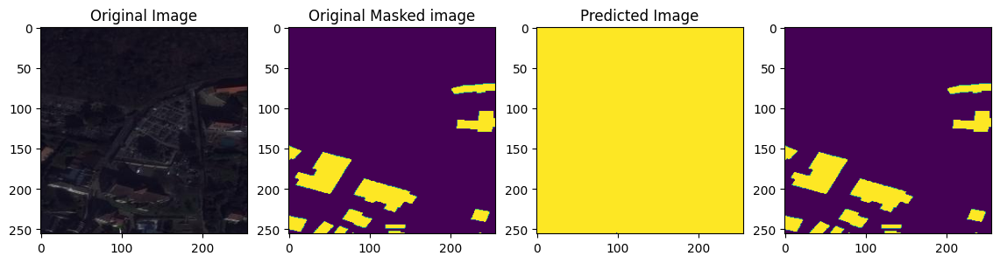

In [68]:
plt.figure(figsize=(14,8))
plt.subplot(141)
plt.title("Original Image")
plt.imshow(test_image)
plt.subplot(142)
plt.title("Original Masked image")
plt.imshow(ground_truth_image)
plt.subplot(143)
plt.title("Predicted Image")
plt.imshow(predicted_image)
mask_diff = predicted_image * (ground_truth_image)
plt.subplot(144)
plt.imshow(mask_diff)

Total number of buildings in the original mask: 0
Total number of buildings predicted: 1
True Positives: 0
False Positives: 0
False Negatives: 0
Accuracy: 1
Recall: 1


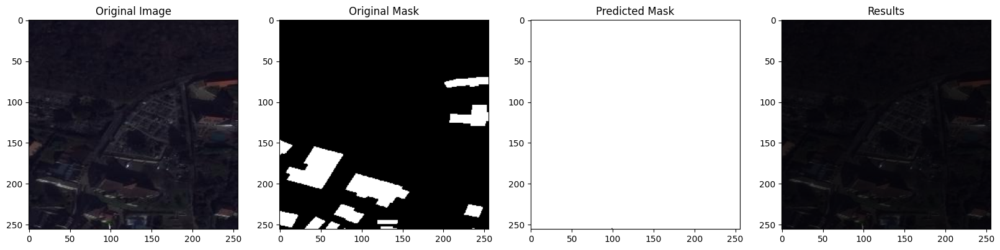

In [69]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import label, regionprops
import matplotlib.colors as mcolors

def analize_masks(original_image, original_mask, predicted_mask):
  original_labels = label(original_mask)
  predicted_labels = label(predicted_mask)

  # Total number of buildings per image
  num_original = len(regionprops(original_labels))
  num_predicted = len(regionprops(predicted_labels))

  print(f"Total number of buildings in the original mask: {num_original}")
  print(f"Total number of buildings predicted: {num_predicted}")

  # image for plotting results
  result_image = np.zeros_like(original_mask, dtype=np.uint8)
  TP=0
  FN=0
  FP=0

  # Building by building analysis
  for region in regionprops(original_labels):
    # Calculate building detected percentage
    overlap = predicted_mask[region.coords[:, 0], region.coords[:, 1]]
    percent_overlap = np.sum(overlap) / region.area

    if percent_overlap >= 0.8:
        # if 80% of the building is detected we consider it as detected
        result_image[region.coords[:, 0], region.coords[:, 1]] = 1  # green
        TP+=1
    else:
        # if less than 80% of the building is detected we consider it as not detected
        result_image[region.coords[:, 0], region.coords[:, 1]] = 2  # red
        FN+=1

  # predicted buildings
  for region in regionprops(predicted_labels):
      # if there are no pixels of the detected building in the original mask, it can be wrongly detected or illegal building
      if not np.any(original_mask[region.coords[:, 0], region.coords[:, 1]]):
          result_image[region.coords[:, 0], region.coords[:, 1]] = 3  # yellow
          FP+=1


  accuracy = 1 if (TP + FP + FN) == 0 else TP / (TP + FP + FN)
  recall = 1 if (TP + FN) == 0 else TP / (TP + FN)

  print(f"True Positives: {TP}")
  print(f"False Positives: {FP}")
  print(f"False Negatives: {FN}")
  print(f"Accuracy: {accuracy}")
  print(f"Recall: {recall}")

  cmap = mcolors.ListedColormap(['black', 'green', 'red', 'yellow'])

  # Plotting
  fig, ax = plt.subplots(1, 4, figsize=(20, 5))
  ax[0].imshow(original_image, cmap='gray')
  ax[0].set_title('Original Image')
  ax[1].imshow(original_mask, cmap='gray')
  ax[1].set_title('Original Mask')
  ax[2].imshow(predicted_mask, cmap='gray')
  ax[2].set_title('Predicted Mask')
  ax[3].imshow(original_image, cmap='gray')
  ax[3].imshow(result_image, cmap=cmap, vmin=0, vmax=3, alpha=0.6)
  ax[3].set_title('Results')

  plt.show()


analize_masks(test_image, ground_truth_image, predicted_image)


Total number of buildings in the original mask: 10
Total number of buildings predicted: 0
True Positives: 0
False Positives: 0
False Negatives: 10
Accuracy: 0.0
Recall: 0.0


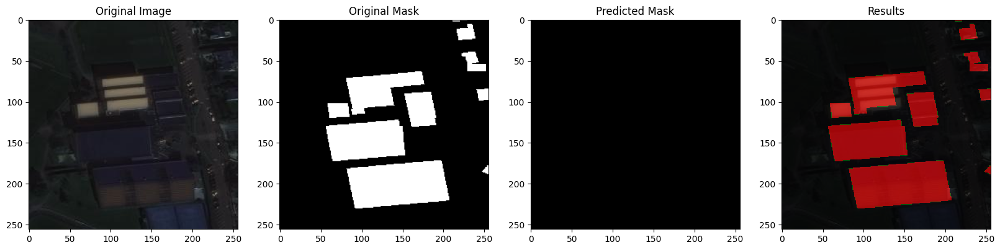

Total number of buildings in the original mask: 12
Total number of buildings predicted: 0
True Positives: 0
False Positives: 0
False Negatives: 12
Accuracy: 0.0
Recall: 0.0


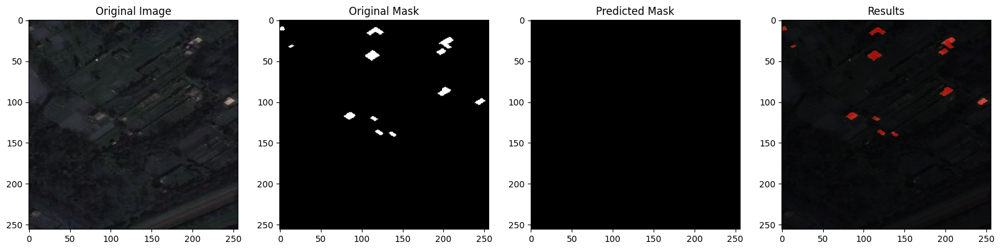

Total number of buildings in the original mask: 12
Total number of buildings predicted: 0
True Positives: 0
False Positives: 0
False Negatives: 12
Accuracy: 0.0
Recall: 0.0


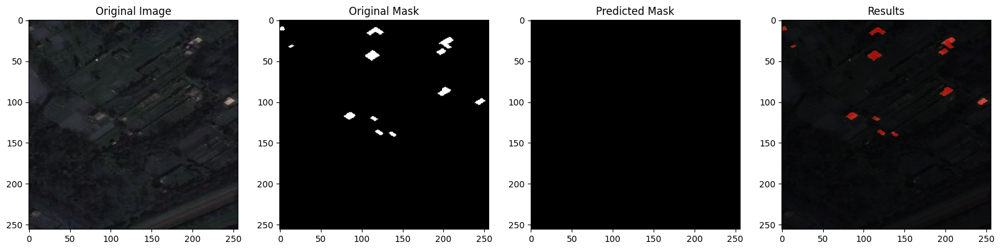

Total number of buildings in the original mask: 2
Total number of buildings predicted: 0
True Positives: 0
False Positives: 0
False Negatives: 2
Accuracy: 0.0
Recall: 0.0


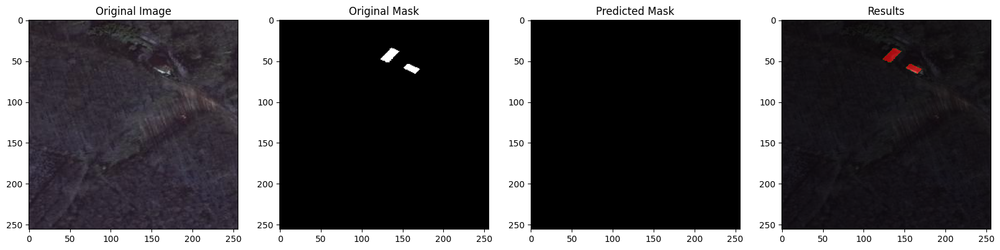

Total number of buildings in the original mask: 2
Total number of buildings predicted: 0
True Positives: 0
False Positives: 0
False Negatives: 2
Accuracy: 0.0
Recall: 0.0


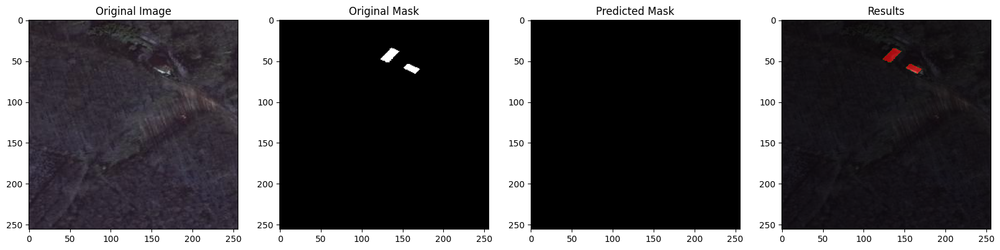

Total number of buildings in the original mask: 2
Total number of buildings predicted: 0
True Positives: 0
False Positives: 0
False Negatives: 2
Accuracy: 0.0
Recall: 0.0


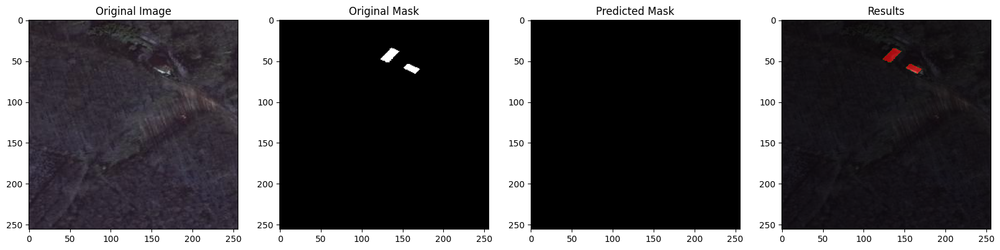

Total number of buildings in the original mask: 2
Total number of buildings predicted: 0
True Positives: 0
False Positives: 0
False Negatives: 2
Accuracy: 0.0
Recall: 0.0


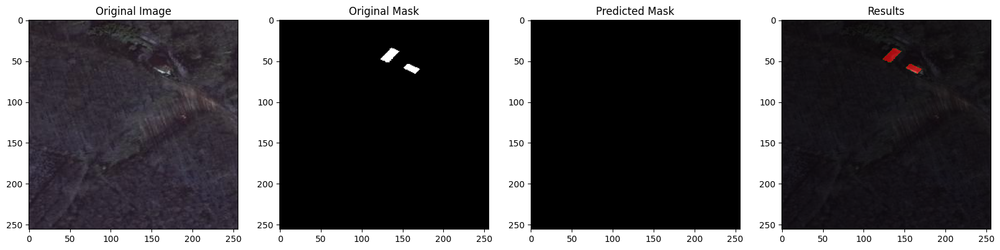

Total number of buildings in the original mask: 12
Total number of buildings predicted: 0
True Positives: 0
False Positives: 0
False Negatives: 12
Accuracy: 0.0
Recall: 0.0


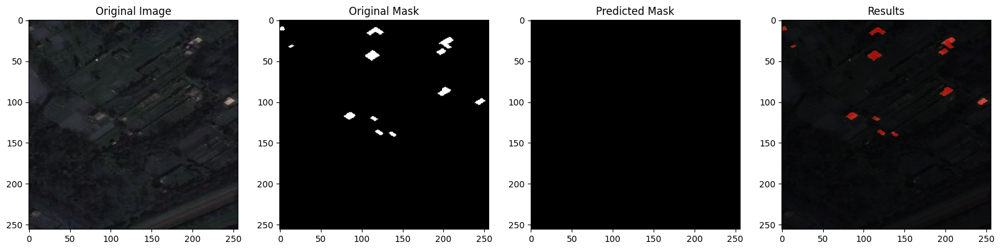

Total number of buildings in the original mask: 14
Total number of buildings predicted: 1
True Positives: 14
False Positives: 0
False Negatives: 0
Accuracy: 1.0
Recall: 1.0


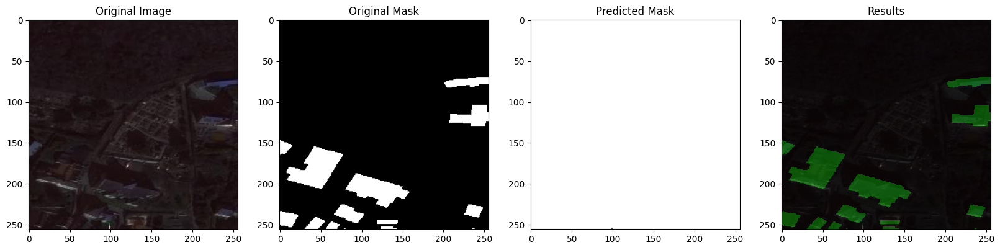

Total number of buildings in the original mask: 2
Total number of buildings predicted: 0
True Positives: 0
False Positives: 0
False Negatives: 2
Accuracy: 0.0
Recall: 0.0


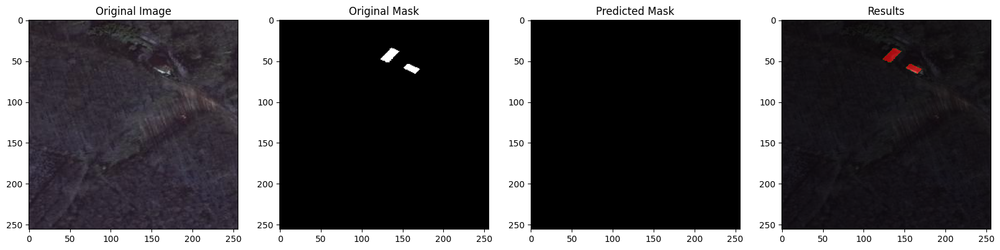

In [70]:
for i in range(10):
    original_image = cv2.imread(f'/content/drive/MyDrive/Colab_Notebooks/Setofimages/metrics_image_test_Paris/original_image_{i}.png')
    original_mask = cv2.imread(f'/content/drive/MyDrive/Colab_Notebooks/Setofimages/metrics_image_test_Paris/ground_truth_image_{i}.png', cv2.IMREAD_GRAYSCALE)
    predicted_mask = cv2.imread(f'/content/drive/MyDrive/Colab_Notebooks/Setofimages/metrics_image_test_Paris/predicted_image_{i}.png', cv2.IMREAD_GRAYSCALE)

    _, original_mask_bin = cv2.threshold(original_mask, 127, 255, cv2.THRESH_BINARY)
    _, predicted_mask_bin = cv2.threshold(predicted_mask, 127, 255, cv2.THRESH_BINARY)
    original_mask = original_mask_bin.astype(bool)
    predicted_mask = predicted_mask_bin.astype(bool)

    analize_masks(original_image, original_mask, predicted_mask)